In [1]:
%load_ext autoreload
%autoreload 2
import os; import sys; sys.path.insert(0,'../')
import pandas as pd
import numpy as np
import tqdm
import warnings
warnings.simplefilter(action='ignore', category=pd.errors.PerformanceWarning)

import atomic.features as fs
import matplotlib.pyplot as plt
import pattern.vis as vis
import sklearn.mixture as mix
import matplotsoccer as mps
import atomic.vaep as vaep
import pattern.action as pat
import atomic.atomic_spadl as ato

The history saving thread hit an unexpected error (DatabaseError('database disk image is malformed',)).History will not be written to the database.


In [2]:
## Configure file and folder names
datafolder = "../data/private"
spadl_h5 = os.path.join(datafolder,"epl-spadl-statsbomb.h5")

In [3]:
games = pd.read_hdf(spadl_h5,"games")
games = games[(games.competition_name == "Premier League")
             & (games.season_name == "2018/2019")]
print("nb of games:", len(games))

#actiontypes = pd.read_hdf(spadl_h5, "atomic_actiontypes")
actiontypes = pd.read_hdf(spadl_h5, "actiontypes")
bodyparts = pd.read_hdf(spadl_h5, "bodyparts")

nb of games: 380


In [4]:
with pd.HDFStore(spadl_h5) as spadlstore:
    actions = []
    for game in tqdm.tqdm(games.itertuples()):
        #a = spadlstore[f"atomic_actions/game_{game.game_id}"]
        a = spadlstore[f"atomic_actions/game_{game.game_id}"]
        #p = predstore[f"game_{game.game_id}"]
        [a] = fs.play_left_to_right([a],game.home_team_id)
        a["is_home"] = a.team_id == game.home_team_id
        #assert len(a) == len(p)
        #a = pd.concat([a,p],axis=1)
        actions.append(a)
    actions = pd.concat(actions)
    actions = actions.merge(spadlstore["atomic_actiontypes"],how="left")
actions[:5]
#actions = pd.concat([actions,vaep.value(actions,actions.scores,actions.concedes)],axis=1)

380it [00:35, 10.68it/s]


,game_id,period_id,action_id,time_seconds,timestamp,team_id,player_id,x,y,dx,dy,type_id,bodypart_id,is_home,type_name
0,14562.0,1.0,0,1.0,00:00:01.344,58.0,9923.0,52.058824,34.430380,-10.588235,-0.000000,0,0,False,pass
1,14562.0,1.0,1,1.5,00:00:02.117,58.0,9917.0,41.470588,34.430380,-0.000000,-0.000000,23,0,False,receival
2,14562.0,1.0,2,2.0,00:00:02.117,58.0,9917.0,41.470588,34.430380,-0.000000,-0.000000,21,0,False,dribble
3,14562.0,1.0,3,2.0,00:00:02.969,58.0,9917.0,41.470588,34.430380,-15.882353,-14.632911,0,0,False,pass
4,14562.0,1.0,4,3.0,00:00:04.338,58.0,9924.0,25.588235,19.797468,-0.000000,-0.000000,23,0,False,receival


In [162]:
# Make a nice action subset
import pattern.action as pat

a = actions[330000:400000].fillna(0)
#a = actions.fillna(0)
a = pat.simplify(a)
#a["type_name"] = a.type_name.mask(~a.is_home,a.type_name + "_opp")
#a["x"] = a.x.mask(a.type_name=="goal",105)
#a["y"] = a.y.mask(a.type_name=="goal",34)
#a["dx"] = a.dx.mask(a.type_name=="shot",105-a.x)
#a["dy"] = a.dy.mask(a.type_name=="shot",32.5-a.y)

def fix_out_y(y):
    return 68 if 68 - y < y else 0

a["y"] = a.y.mask(a.type_name=="out",a.y.apply(fix_out_y))

import numpy as np
a["x"] = a.x + np.random.normal(0,1,len(a))
a["y"] = a.y + np.random.normal(0,1,len(a))
a["dx"] = a.dx + (a.dx != 0).apply(int) * np.random.normal(0,1,len(a))
a["dy"] = a.dy + (a.dy != 0).apply(int) * np.random.normal(0,1,len(a))

#a = pd.concat([a,fs.polar(a),fs.movement_polar(a),fs.direction(a)],axis=1)
mirror_a = a.copy()
mirror_a["y"] = 68 - mirror_a["y"]
mirror_a["dy"] = - mirror_a["dy"]
a = pd.concat([a,mirror_a],axis=0)
a = pd.concat([a,fs.polar(a),fs.movement_polar(a),fs.direction(a)],axis=1)
a = a[~(((a.type_name == "dribble") | (a.type_name == "pass")) & (a.mov_d_a0 < 10))]

In [105]:
len(a)

96156

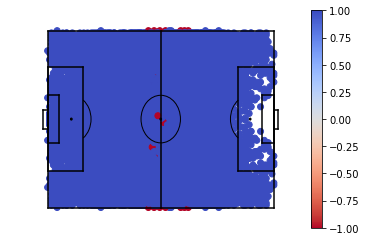

102


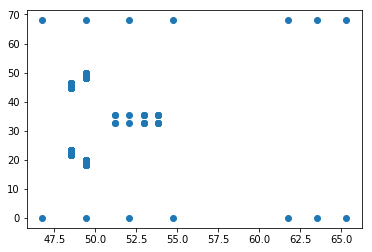

28552


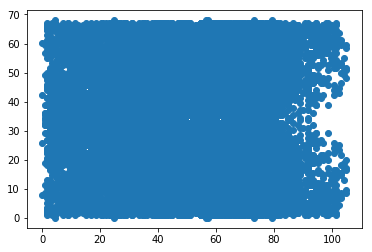

In [106]:
from sklearn.ensemble import IsolationForest as IF
from sklearn.neighbors import LocalOutlierFactor as LOF

s = a[a.type_name == "pass"]
#print(s.x.value_counts())
mps.field(show=False)

#model = IF(contamination=0.001).fit(s[["x","y"]])
# c = model.decision_function(s[["x","y"]])
#c = model.predict(s[["x","y"]])

c = LOF(contamination="auto").fit_predict(s[["x","y"]])
#c = lof.decision_function(s[["x","y"]])

plt.scatter(s.x,s.y,c=c,cmap="coolwarm_r")
plt.colorbar()
plt.show()
for i in [-1,1]:
    print(sum(c==i))
    #mps.field(show=False)
    plt.scatter(s.x[c==i],s.y[c==i])
    plt.show()

In [156]:
import sklearn
import sklearn.mixture as mix
from sklearn.mixture.gaussian_mixture import (
    _estimate_gaussian_parameters,
    _compute_precision_cholesky,
    )
import numpy as np
import numpy.linalg as linalg

import sklearn.cluster as cluster

class WeightedGMM(mix.GaussianMixture):
    
    def fit(self,X,weights=None,*k,**kw):
        if weights is None:
            weights = np.zeros(len(X)) + 1
        pos_weight_idx = weights > 1e-10
        self.Xweights = weights[pos_weight_idx]
        return super().fit(X[pos_weight_idx],*k,**kw)
        
    def _m_step(self, X, log_resp):
            """M step.
            Parameters
            ----------
            X : array-like, shape (n_samples, n_features)
            log_resp : array-like, shape (n_samples, n_components)
                Logarithm of the posterior probabilities (or responsibilities) of
                the point of each sample in X.
            """
            resp = (self.Xweights*np.exp(log_resp).T).T
            self.weights_, self.means_, self.covariances_ = (
                _estimate_gaussian_parameters(X,resp, self.reg_covar,
                                              self.covariance_type))
            
            self.weights_ /= np.sum(self.Xweights)
#             for i in range(len(self.covariances_)):
#                 [[a,b],[c,d]] = self.covariances_[i]
#                 if min(a,d) < 5:
#                     self.covariances_[i] *= 5/min(a,d)
#                 self.covariances_[i] = np.array([[a,b],[c,d]])
                
            self.precisions_cholesky_ = _compute_precision_cholesky(
                self.covariances_, self.covariance_type)
            
    def _initialize_parameters(self, X, random_state):
            """Initialize the model parameters.
            Parameters
            ----------
            X : array-like, shape  (n_samples, n_features)
            random_state : RandomState
                A random number generator instance.
            """
            n_samples, _ = X.shape

            if self.init_params == 'kmeans':
                resp = np.zeros((n_samples, self.n_components))
                clus = cluster.KMeans(n_clusters=self.n_components, n_init=20,
                                       random_state=random_state)
                label = clus.fit(X,sample_weight=self.Xweights).labels_
                resp[np.arange(n_samples), label] = 1
            elif self.init_params == 'random':
                resp = random_state.rand(n_samples, self.n_components)
                resp /= resp.sum(axis=1)[:, np.newaxis]
            else:
                raise ValueError("Unimplemented initialization method '%s'"
                                 % self.init_params)

            self._initialize(X, resp)
            
    def score_samples(self,X,weights=None):
        if weights is None:
            weights = np.zeros(len(X)) + 1
        pos_weights_idx = weights > 1e-10
        
        scores = np.zeros(len(X))
        pos_weights = weights[pos_weights_idx]
        pos_scores = super().score_samples(X[pos_weights_idx])
        scores[pos_weights_idx] = (pos_weights*pos_scores.T).T
        return scores
    
    def predict_proba(self,X,weights=None):
        if weights is None:
            weights = np.zeros(len(X)) + 1
        pos_weights_idx = weights > 1e-10
        
        p = np.zeros((len(X),self.n_components))
        pos_weights = weights[pos_weights_idx]
        pos_probs = super().predict_proba(X[pos_weights_idx])
        p[pos_weights_idx,:] = (pos_weights*pos_probs.T).T
        return p

def candidates(df,columns,weightsdf,n=5,verbose=True):
    candidates = []
    for name in weightsdf.columns:
        weights = weightsdf[name].values
        n_components = range(1,min(n+1,int(sum(weights))))
        if verbose:
            n_components = tqdm.tqdm(n_components,desc=name)
        for i in n_components:
            try:
                model = WeightedGMM(n_components=i,
                                    covariance_type='full',
                                    n_init = 1).fit(df[columns].values,weights)
                model.name = name
                #model.loglikelihood = model.score_samples(X,weights).sum()
                model.df=df
                model.columns = columns
                model.weights = weights
                model.likelihood = model.score_samples(
                    df[columns],weights
                ).sum()
                candidates.append(model)
            except sklearn.exceptions.ConvergenceWarning:
                break
    return candidates

# def scores(models,verbose=True):
#     if verbose:
#         models = tqdm.tqdm(models)
#     return list((model.name,
#                  model.n_components,
#                  model.score_samples(model.df[model.columns],
#                                      model.weights).sum())
#                 for model in models)

def probabilities(models):
    weights = []
    for model in models:
        probs = model.predict_proba(model.df[model.columns].values,model.weights)
        columns = list(f"{model.name}_{i}" for i in range(model.n_components))
        weights.append(pd.DataFrame(probs,columns=columns))
    return pd.concat(weights,axis=1)

In [157]:
%%time
import warnings
warnings.filterwarnings("error")
from sklearn.neighbors import LocalOutlierFactor as LOF

cols = ["x","y",
        #"dx","dy"
        #"dist_to_goal_a0",
        #"angle_to_goal_a0",
        #"mov_d_a0",
        #"mov_angle_a0"
        #"dx_a0",
        #"dy_a0"
       ]

w = pd.DataFrame()
#for t in ["dribble","pass","shot","cross"]:
for t in set(a.type_name):
#for t in ["keeper_catch","cross","goal","goalkick","throw_in","out"]:
    t_idx = (a.type_name == t)
    if sum(t_idx) > 20:
        c = LOF(contamination="auto").fit_predict(a[t_idx][["x","y"]])#,"mov_angle_a0"]])
        t_idx[t_idx] = c==1
        print(f"removed {sum(c==-1)} {t} examples, {sum(t_idx)} examples remaining")
        w[t] = t_idx.apply(float)

can_i = candidates(a,cols,w,n=25)

removed 34 pass examples, 28790 examples remaining
removed 46 keeper_catch examples, 396 examples remaining
removed 0 offside examples, 26 examples remaining
removed 0 foul examples, 1104 examples remaining
removed 22 clearance examples, 2398 examples remaining
removed 60 receival examples, 35766 examples remaining
removed 0 goal examples, 122 examples remaining
removed 22 shot examples, 1122 examples remaining
removed 0 tackle examples, 1756 examples remaining
removed 8 interception examples, 9106 examples remaining
removed 26 corner examples, 456 examples remaining
removed 2 yellow_card examples, 132 examples remaining
removed 6 freekick examples, 1080 examples remaining
removed 14 goalkick examples, 688 examples remaining
removed 4 dribble examples, 6742 examples remaining
removed 0 take_on examples, 1550 examples remaining
removed 2 cross examples, 968 examples remaining
removed 2 bad_touch examples, 1142 examples remaining
removed 22 throw_in examples, 1966 examples remaining









pass:   0%|          | 0/25 [00:00<?, ?it/s]






pass:   4%|▍         | 1/25 [00:00<00:03,  7.34it/s]

removed 44 out examples, 840 examples remaining









pass:   8%|▊         | 2/25 [00:00<00:07,  3.18it/s]






pass:  12%|█▏        | 3/25 [00:01<00:10,  2.13it/s]






pass:  16%|█▌        | 4/25 [00:02<00:13,  1.53it/s]






pass:  20%|██        | 5/25 [00:04<00:19,  1.02it/s]






pass:  24%|██▍       | 6/25 [00:06<00:25,  1.33s/it]






pass:  28%|██▊       | 7/25 [00:09<00:33,  1.88s/it]






pass:  32%|███▏      | 8/25 [00:13<00:42,  2.48s/it]






pass:  36%|███▌      | 9/25 [00:17<00:48,  3.02s/it]






pass:  40%|████      | 10/25 [00:22<00:53,  3.55s/it]






pass:  44%|████▍     | 11/25 [00:27<00:55,  3.96s/it]






pass:  48%|████▊     | 12/25 [00:34<01:03,  4.92s/it]






pass:  52%|█████▏    | 13/25 [00:40<01:00,  5.05s/it]






pass:  56%|█████▌    | 14/25 [00:47<01:01,  5.57s/it]






pass:  60%|██████    | 15/25 [00:56<01:07,  6.75s/it]






pass:  64%|██████▍   | 16/25 [01:05<01:05,  7.33s/it]






pass:  68%|██████▊   | 17/25 [01:14<01:03,  7.88s/it]






pass:  72%|███████▏  | 18/25 [01:23<00:57

clearance:  60%|██████    | 15/25 [00:04<00:03,  2.54it/s]






clearance:  64%|██████▍   | 16/25 [00:04<00:03,  2.43it/s]






clearance:  68%|██████▊   | 17/25 [00:04<00:03,  2.36it/s]






clearance:  72%|███████▏  | 18/25 [00:05<00:03,  2.33it/s]






clearance:  76%|███████▌  | 19/25 [00:05<00:02,  2.21it/s]






clearance:  80%|████████  | 20/25 [00:06<00:02,  2.24it/s]






clearance:  84%|████████▍ | 21/25 [00:06<00:01,  2.10it/s]






clearance:  88%|████████▊ | 22/25 [00:07<00:01,  2.05it/s]






clearance:  92%|█████████▏| 23/25 [00:07<00:00,  2.00it/s]






clearance:  96%|█████████▌| 24/25 [00:08<00:00,  1.96it/s]






clearance: 100%|██████████| 25/25 [00:08<00:00,  1.93it/s]













receival:   0%|          | 0/25 [00:00<?, ?it/s]






receival:   4%|▍         | 1/25 [00:00<00:03,  6.97it/s]






receival:   8%|▊         | 2/25 [00:01<00:09,  2.55it/s]






receival:  12%|█▏        | 3/25 [00:02<00:14,  1.50it/s]






receival:  16%|█▌        | 4/25 [0

tackle:  88%|████████▊ | 22/25 [00:06<00:01,  2.39it/s]






tackle:  92%|█████████▏| 23/25 [00:06<00:00,  2.36it/s]






tackle:  96%|█████████▌| 24/25 [00:07<00:00,  2.29it/s]






tackle: 100%|██████████| 25/25 [00:07<00:00,  2.23it/s]













interception:   0%|          | 0/25 [00:00<?, ?it/s]






interception:   8%|▊         | 2/25 [00:00<00:03,  6.51it/s]






interception:  12%|█▏        | 3/25 [00:00<00:06,  3.27it/s]






interception:  16%|█▌        | 4/25 [00:01<00:08,  2.40it/s]






interception:  20%|██        | 5/25 [00:02<00:11,  1.72it/s]






interception:  24%|██▍       | 6/25 [00:03<00:13,  1.42it/s]






interception:  28%|██▊       | 7/25 [00:04<00:14,  1.28it/s]






interception:  32%|███▏      | 8/25 [00:05<00:16,  1.06it/s]






interception:  36%|███▌      | 9/25 [00:07<00:17,  1.08s/it]






interception:  40%|████      | 10/25 [00:08<00:18,  1.20s/it]






interception:  44%|████▍     | 11/25 [00:10<00:20,  1.48s/it]






interception: 

goalkick:  32%|███▏      | 8/25 [00:00<00:01,  8.68it/s]






goalkick:  36%|███▌      | 9/25 [00:00<00:02,  7.72it/s]






goalkick:  40%|████      | 10/25 [00:01<00:02,  7.43it/s]






goalkick:  44%|████▍     | 11/25 [00:01<00:01,  7.22it/s]






goalkick:  48%|████▊     | 12/25 [00:01<00:01,  6.88it/s]






goalkick:  52%|█████▏    | 13/25 [00:01<00:01,  6.52it/s]






goalkick:  56%|█████▌    | 14/25 [00:01<00:01,  5.95it/s]






goalkick:  60%|██████    | 15/25 [00:01<00:01,  5.53it/s]






goalkick:  64%|██████▍   | 16/25 [00:02<00:01,  5.41it/s]






goalkick:  68%|██████▊   | 17/25 [00:02<00:01,  5.34it/s]






goalkick:  72%|███████▏  | 18/25 [00:02<00:01,  5.11it/s]






goalkick:  76%|███████▌  | 19/25 [00:02<00:01,  4.83it/s]






goalkick:  80%|████████  | 20/25 [00:03<00:01,  4.76it/s]






goalkick:  84%|████████▍ | 21/25 [00:03<00:00,  4.71it/s]






goalkick:  88%|████████▊ | 22/25 [00:03<00:00,  4.54it/s]






goalkick:  92%|█████████▏| 23/25 [00:03<00

bad_touch:  44%|████▍     | 11/25 [00:01<00:03,  4.61it/s]






bad_touch:  48%|████▊     | 12/25 [00:02<00:03,  4.24it/s]






bad_touch:  52%|█████▏    | 13/25 [00:02<00:03,  3.98it/s]






bad_touch:  56%|█████▌    | 14/25 [00:02<00:02,  3.76it/s]






bad_touch:  60%|██████    | 15/25 [00:02<00:02,  3.50it/s]






bad_touch:  64%|██████▍   | 16/25 [00:03<00:02,  3.69it/s]






bad_touch:  68%|██████▊   | 17/25 [00:03<00:02,  3.65it/s]






bad_touch:  72%|███████▏  | 18/25 [00:03<00:01,  3.61it/s]






bad_touch:  76%|███████▌  | 19/25 [00:04<00:01,  3.58it/s]






bad_touch:  80%|████████  | 20/25 [00:04<00:01,  3.50it/s]






bad_touch:  84%|████████▍ | 21/25 [00:04<00:01,  3.41it/s]






bad_touch:  88%|████████▊ | 22/25 [00:04<00:00,  3.31it/s]






bad_touch:  92%|█████████▏| 23/25 [00:05<00:00,  3.21it/s]






bad_touch:  96%|█████████▌| 24/25 [00:05<00:00,  3.09it/s]






bad_touch: 100%|██████████| 25/25 [00:06<00:00,  2.92it/s]













throw_in:   0%|   

CPU times: user 18min 53s, sys: 13min 22s, total: 32min 16s
Wall time: 8min 36s


In [158]:
models_i = pat.ilp_select_models_bic(can_i,verbose=True)
#models_i = pat.select_models_solo_bic(can_i)
list((m.name,m.n_components) for m in models_i)

Iter	Lower Bound	Upper Bound	Gap

ECOS 2.0.7 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +1.655e+06  -2.182e+06  +4e+06  7e-03  2e-10  1e+00  4e+03    ---    ---    1  1  - |  -  - 
 1  +1.651e+06  +9.391e+05  +7e+05  1e-03  4e-11  1e+01  7e+02  0.8146  4e-03   0  1  1 |  0  0
 2  +1.653e+06  +1.290e+06  +4e+05  6e-04  2e-11  3e+02  4e+02  0.8886  4e-01   0  2  1 |  0  0
 3  +1.648e+06  +1.585e+06  +7e+04  3e-04  4e-12  5e+01  7e+01  0.8303  9e-03   0  1  1 |  0  0
 4  +1.644e+06  +1.629e+06  +2e+04  9e-05  9e-13  1e+01  2e+01  0.9272  2e-01   0  2  2 |  0  0
 5  +1.643e+06  +1.630e+06  +1e+04  7e-05  7e-13  1e+01  1e+01  0.4169  5e-01   0  2  1 |  0  0
 6  +1.640e+06  +1.637e+06  +3e+03  2e-05  2e-13  3e+00  3e+00  0.8150  9e-02   0  2  2 |  0  0
 7  +1.639e+06  +1.638e+06  +9e+02  5e-06  6e-14  9e-01  9e-01  0.9623  2e-01   0  1  1 |  0  0
 8  +1.639e+0

[('pass', 17),
 ('keeper_catch', 3),
 ('offside', 1),
 ('foul', 3),
 ('clearance', 3),
 ('receival', 15),
 ('goal', 1),
 ('shot', 3),
 ('tackle', 7),
 ('interception', 8),
 ('corner', 2),
 ('yellow_card', 1),
 ('freekick', 3),
 ('goalkick', 2),
 ('dribble', 9),
 ('take_on', 6),
 ('cross', 6),
 ('bad_touch', 6),
 ('throw_in', 6),
 ('out', 4)]

In [126]:
models_i = pat.ilp_select_models_aic(can_i,verbose=True)
list((m.name,m.n_components) for m in models_i)

Iter	Lower Bound	Upper Bound	Gap

ECOS 2.0.7 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +2.431e+06  -9.835e+05  +3e+06  7e-03  2e-10  1e+00  3e+03    ---    ---    1  1  - |  -  - 
 1  +2.424e+06  +1.939e+06  +5e+05  7e-04  3e-11  1e+01  5e+02  0.8589  4e-03   0  1  1 |  0  0
 2  +2.427e+06  +2.228e+06  +2e+05  4e-04  1e-11  2e+02  2e+02  0.9890  4e-01   0  2  1 |  0  0
 3  +2.423e+06  +2.397e+06  +3e+04  2e-04  1e-12  3e+01  3e+01  0.8778  6e-03   0  1  1 |  0  0
 4  +2.421e+06  +2.415e+06  +7e+03  6e-05  3e-13  7e+00  7e+00  0.9890  3e-01   0  1  2 |  0  0
 5  +2.421e+06  +2.418e+06  +3e+03  3e-05  2e-13  3e+00  3e+00  0.8353  3e-01   0  1  1 |  0  0
 6  +2.420e+06  +2.419e+06  +2e+03  2e-05  9e-14  2e+00  2e+00  0.7084  4e-01   0  1  1 |  0  0
 7  +2.420e+06  +2.420e+06  +6e+02  6e-06  3e-14  6e-01  6e-01  0.8160  2e-01   0  1  1 |  0  0
 8  +2.420e+0

[('pass', 25),
 ('keeper_catch', 1),
 ('offside', 25),
 ('foul', 7),
 ('clearance', 21),
 ('receival', 25),
 ('goal', 25),
 ('shot', 5),
 ('tackle', 16),
 ('interception', 25),
 ('corner', 2),
 ('yellow_card', 25),
 ('freekick', 10),
 ('goalkick', 2),
 ('dribble', 25),
 ('take_on', 11),
 ('cross', 12),
 ('bad_touch', 7),
 ('throw_in', 13),
 ('out', 7)]

In [159]:
w_i = probabilities(models_i)

pass 17


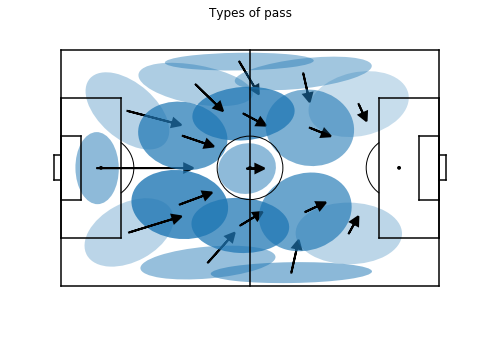

ValueError: Item wrong length 96486 instead of 96490.

In [163]:
import warnings
warnings.filterwarnings("ignore")

colors = ["#377eb8",
    "#e41a1c",
    "#4daf4a",
    "#984ea3",
    "#ff7f00",
    "#ffff33",
    "#a65628",
    "#f781bf",
    "#999999",
    ]

def scattercolors(actions,weights,samplefn="max"):
    pos_weights_idx = weights.values.sum(axis=1) > 1e-1
    a = actions[pos_weights_idx]
    weights = weights[pos_weights_idx]

    if samplefn == "max":
        labels = np.argmax(weights.values,axis=1)
    else:
        labels = np.apply_along_axis(sample,axis=1, arr=weights.values)

    pcolors = [colors[l % len(colors)] for l in labels]
    return a,pcolors


for m_i in models_i:
    ax = mps.field(show=False,figsize=8)
    print(m_i.name,m_i.n_components)
    strengths_i = m_i.weights_ / np.max(m_i.weights_) * 0.8
    for i,(mean,covar,strength_i) in enumerate(zip(m_i.means_, m_i.covariances_,strengths_i)):
        #print(mean,covar)
        vis.add_ellips(ax,mean[:2],covar[:2,:2],alpha=strength_i)
        #vis.add_ellips(ax,mean[:2],[[covar[0],0],[0,covar[1]]],alpha=strength_i)
        x,y = mean[:2]
        we = w_i[f"{m_i.name}_{i}"].values
        dx = np.average(m_i.df["dx"].values,weights=we)
        dy = np.average(m_i.df["dy"].values,weights=we)
        d = 1
        strength_ii=1
        vis.add_arrow(ax,x,y,d*dx,d*dy,
                                  alpha=strength_ii,
                                  linewidth=2*strength_ii,
                                  arrowsize=2.5*strength_ii,
                                  #linewidth=2,
                                  threshold=1)
    plt.title(f"Types of {m_i.name}")
    plt.show()
    
    columns = list(f"{m_i.name}_{i}" for i in range(m_i.n_components))
    acol,c = scattercolors(a,w_i[columns])
    
    axs = vis.axesxypolar()
    axs[0].scatter(acol.x,acol.y,c=c)
    axs[1].scatter(acol.mov_angle_a0,acol.mov_d_a0,c=c)
    #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    #axs[1].scatter(dfc.mov_angle_a0,dfc.mov_d_a0,c=dfc.membership,cmap="Blues")
    plt.show()

pass_0 7122 1719.0938311819225


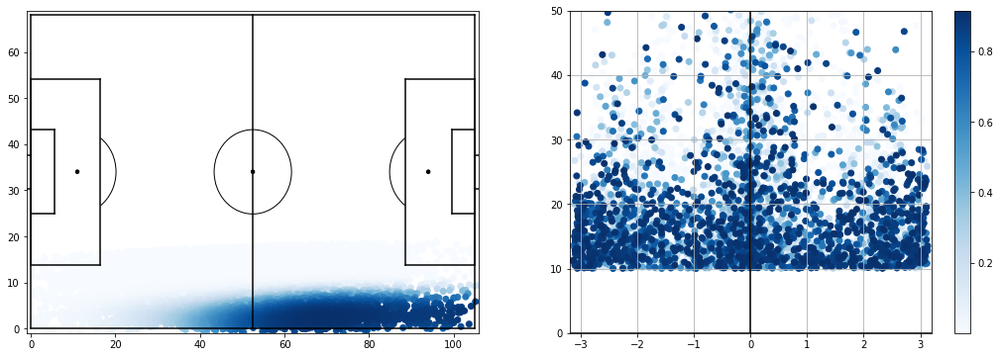

pass_1 6112 1505.0230565121442


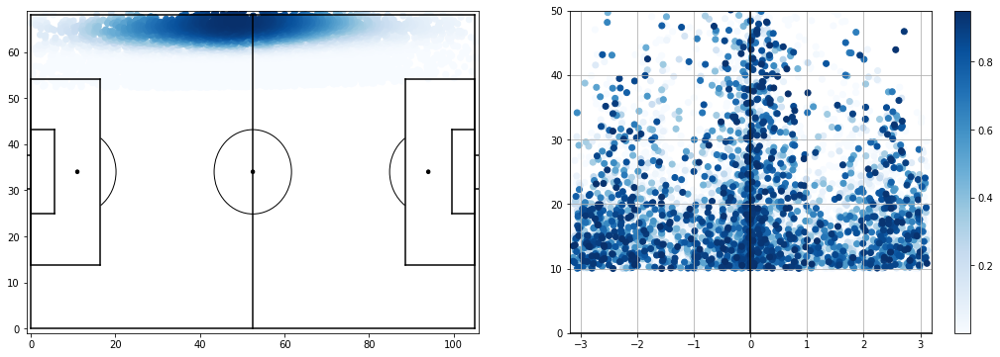

pass_2 12099 1543.813995790326


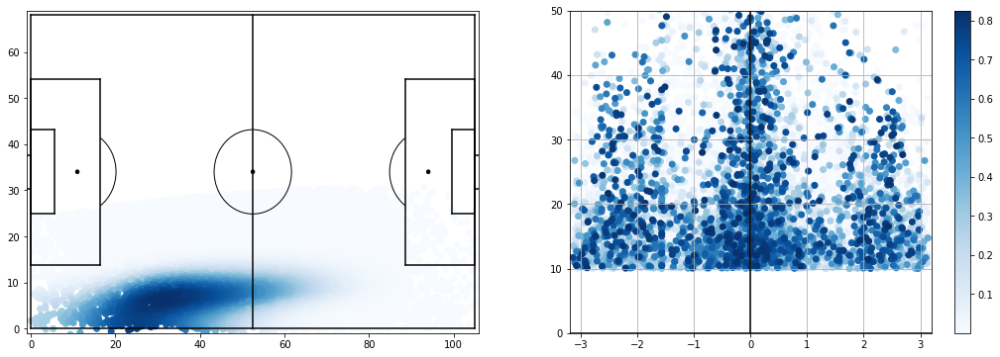

pass_3 9044 1674.6504930492047


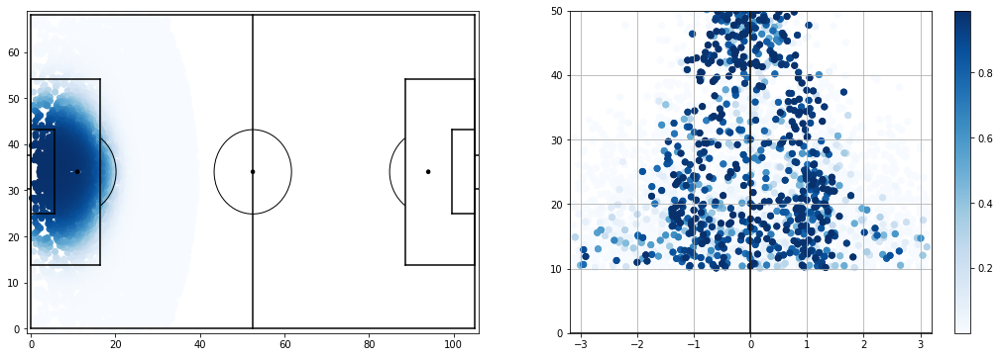

pass_4 23781 1657.0231491224617


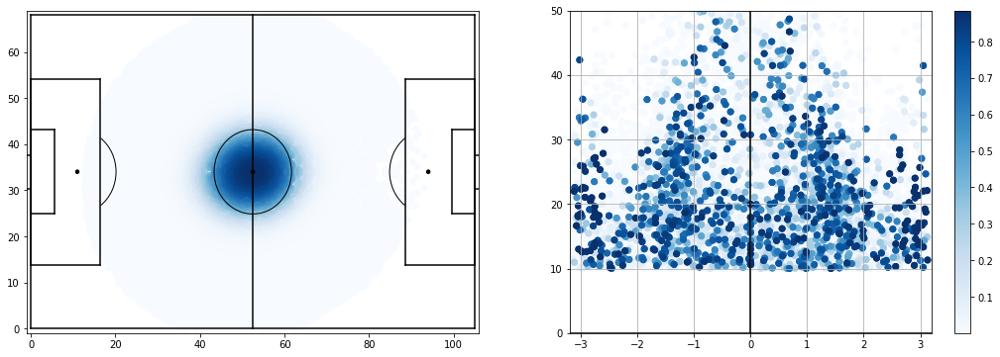

pass_5 12341 1391.063858582497


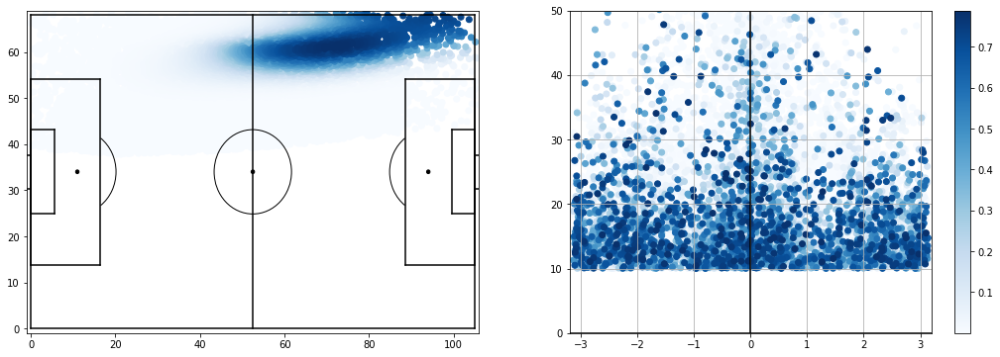

pass_6 27056 2674.768323017061


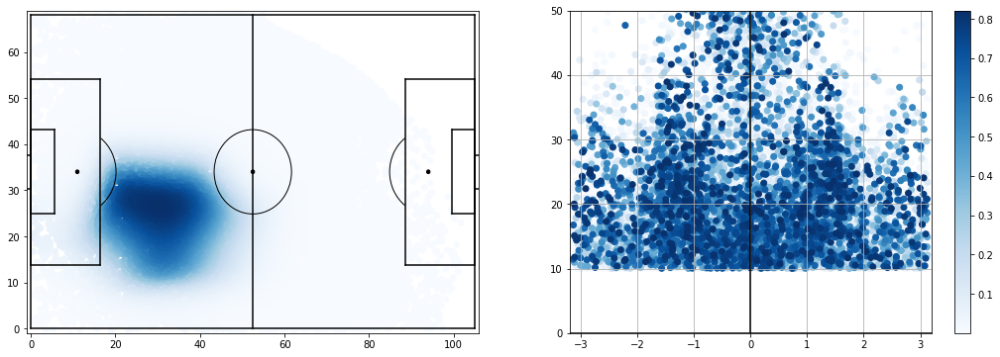

pass_7 23276 2540.4660226991496


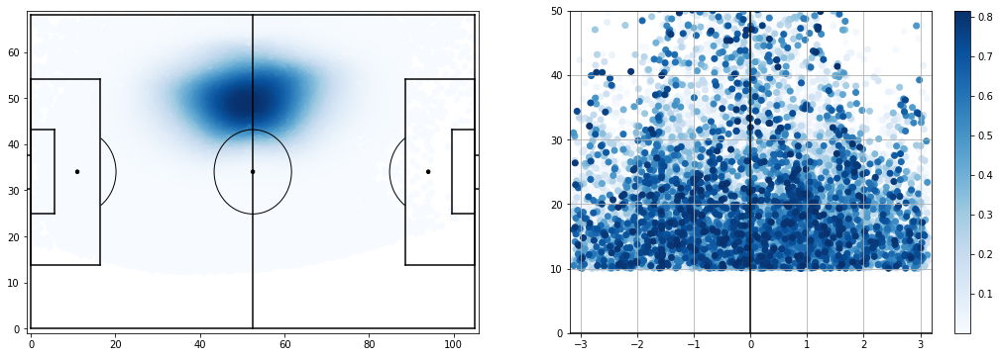

pass_8 22726 1071.770967401192


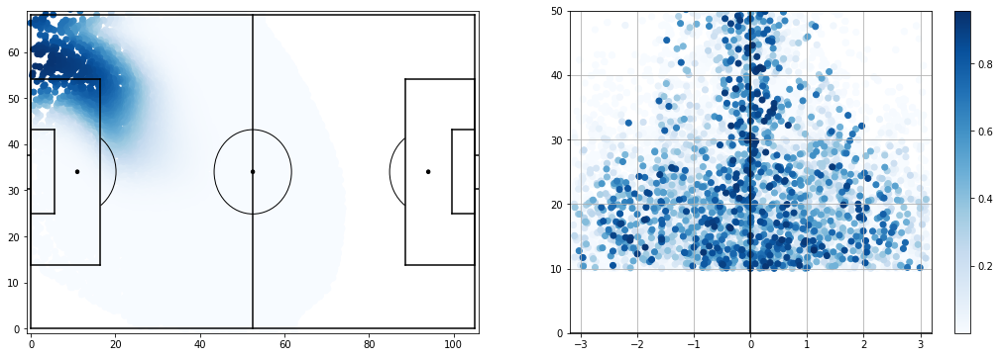

pass_9 27652 2382.1794108287645


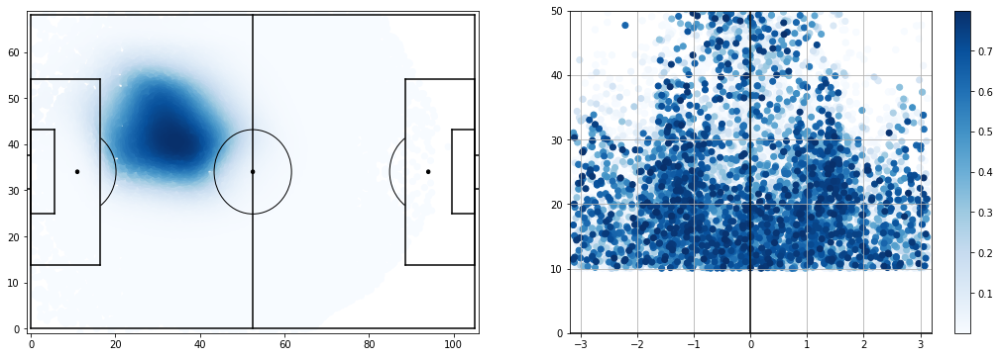

pass_10 26085 1937.0349916721104


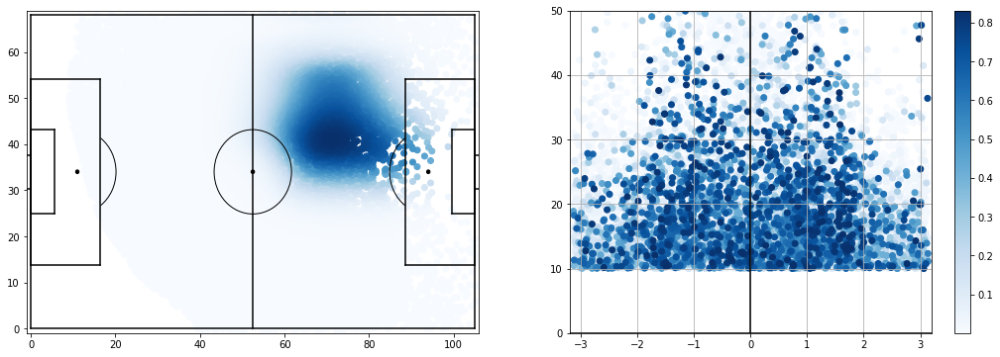

pass_11 22129 992.3642784199158


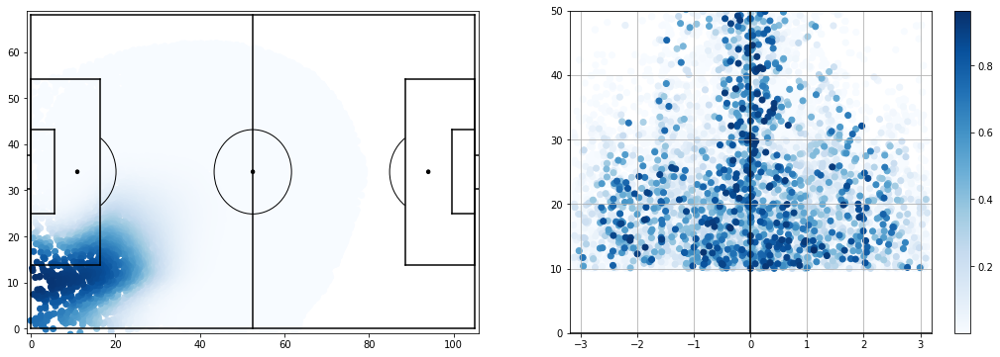

pass_12 20010 994.6389763805552


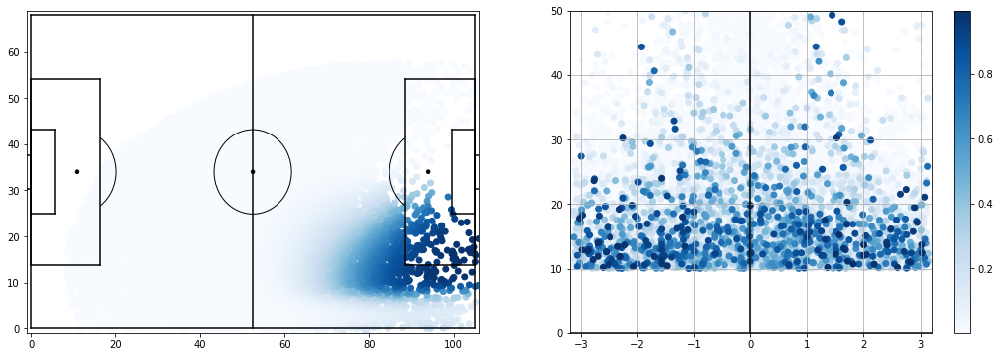

pass_13 23214 2480.526838804445


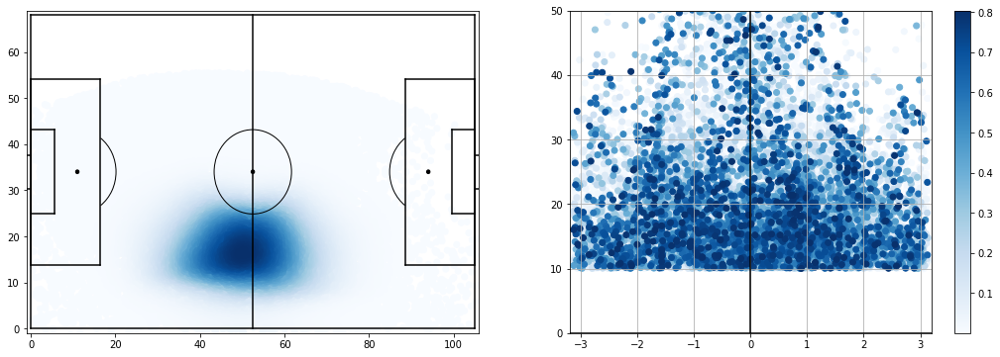

pass_14 21035 811.7578661894564


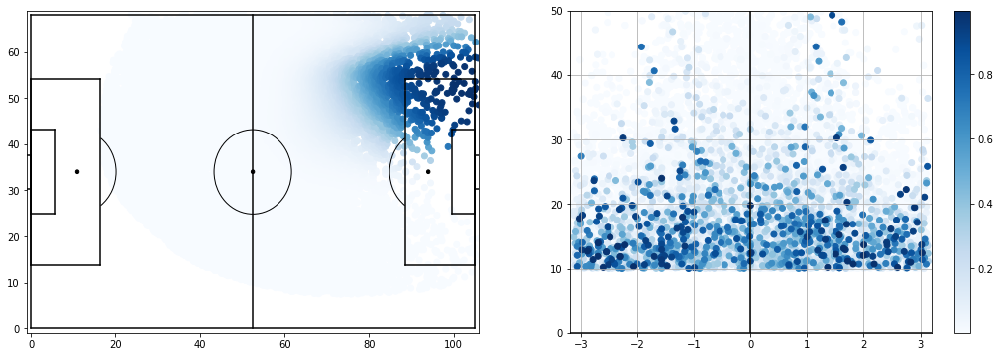

pass_15 15366 1204.119423355271


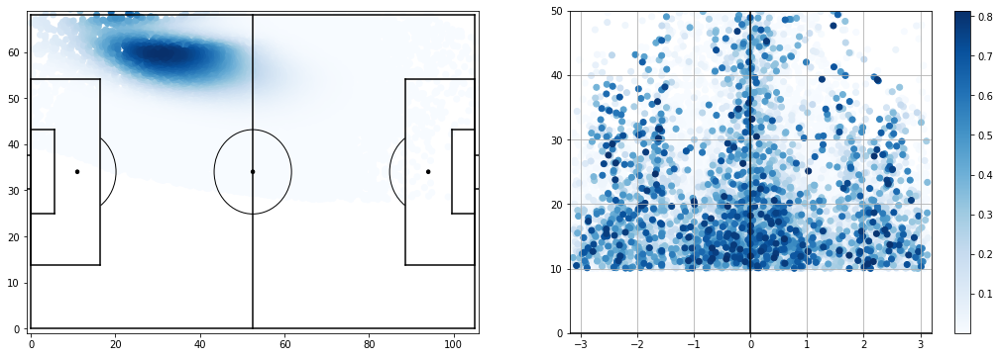

pass_16 26471 2209.704516993413


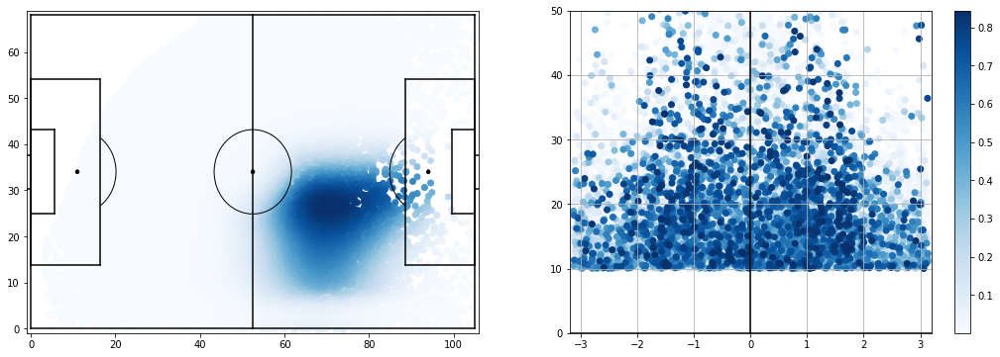

keeper_catch_0 391 160.8375624629702


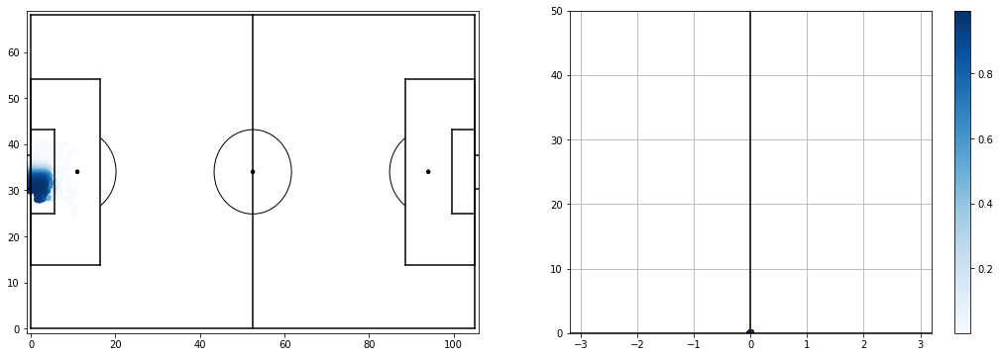

keeper_catch_1 391 160.8375624629726


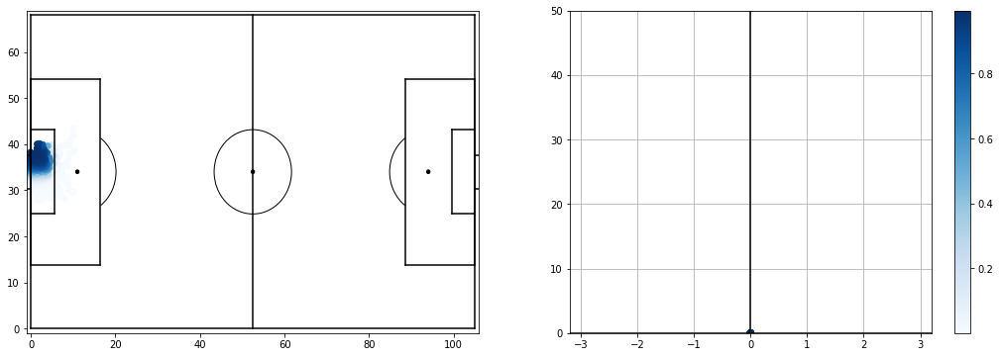

keeper_catch_2 396 74.3248750740571


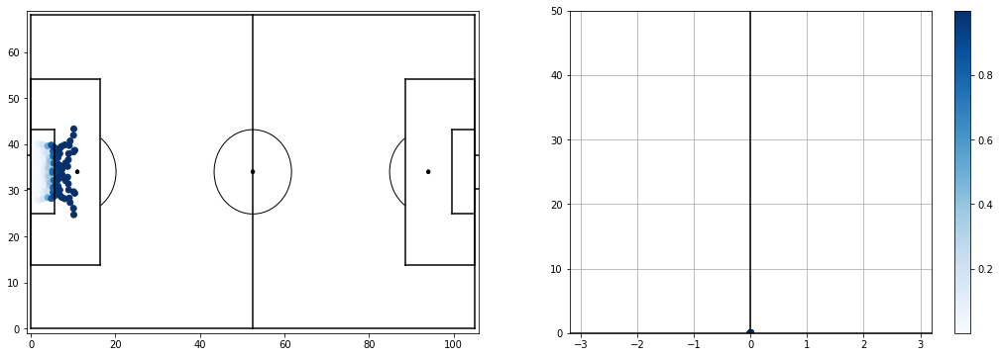

offside_0 26 26.0


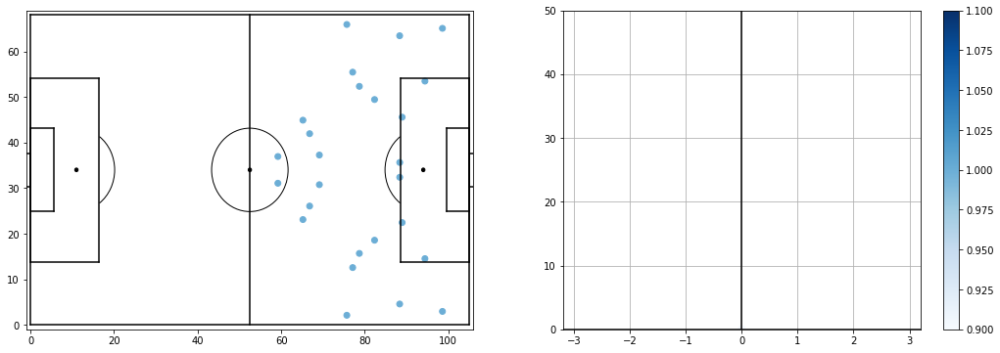

foul_0 1104 255.52365095229527


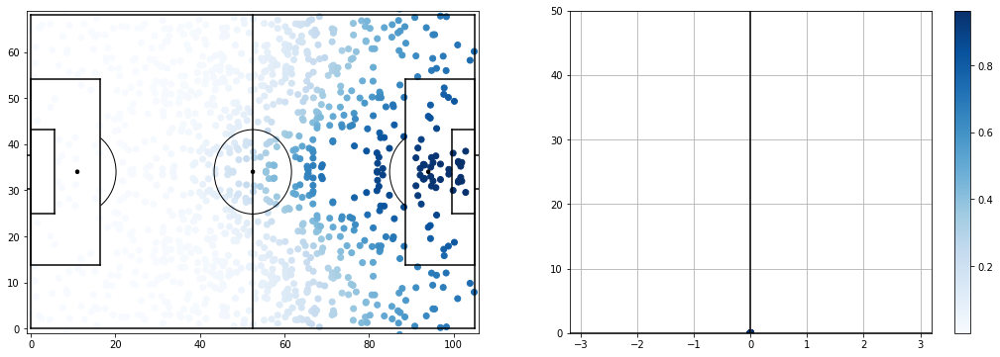

foul_1 1104 425.0701564509764


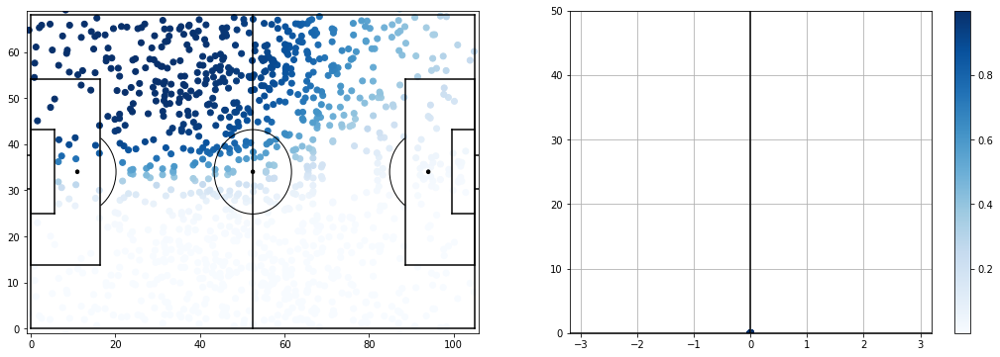

foul_2 1104 423.4061925967281


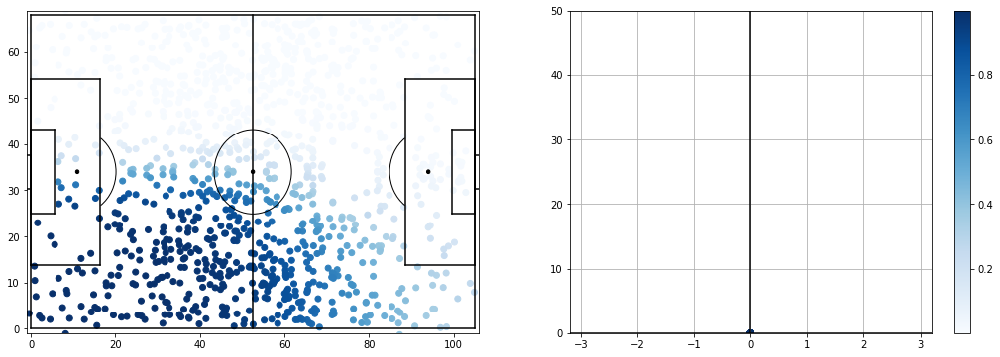

clearance_0 2398 529.9553001778289


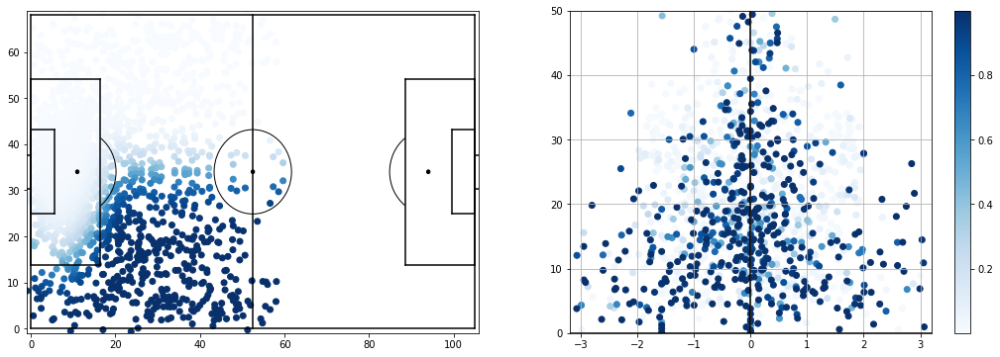

clearance_1 2090 1338.0893996443392


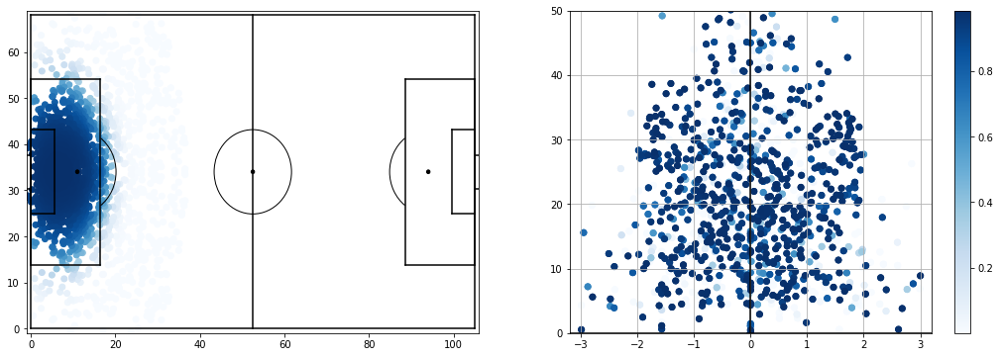

clearance_2 2398 529.9553001778286


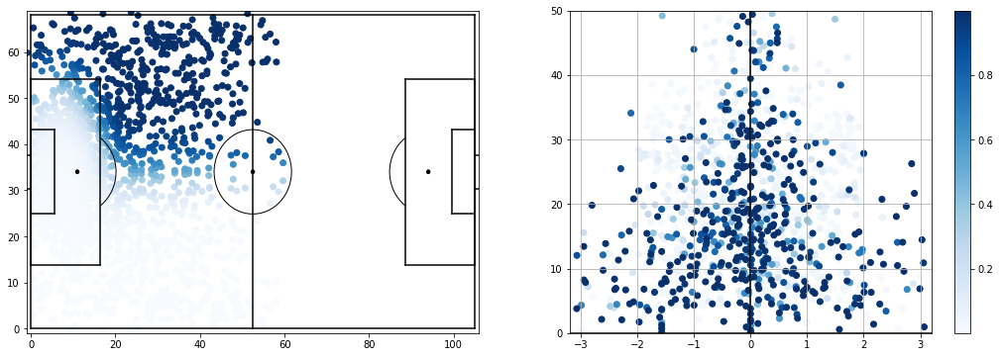

receival_0 32055 2611.4339772370777


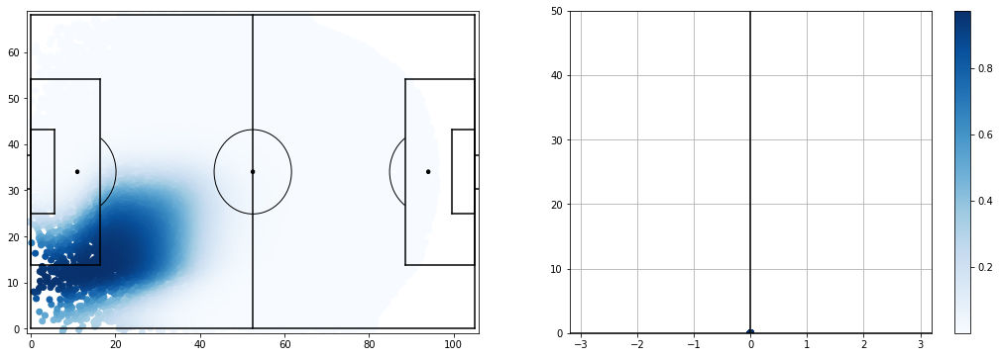

receival_1 33481 3569.0478211157347


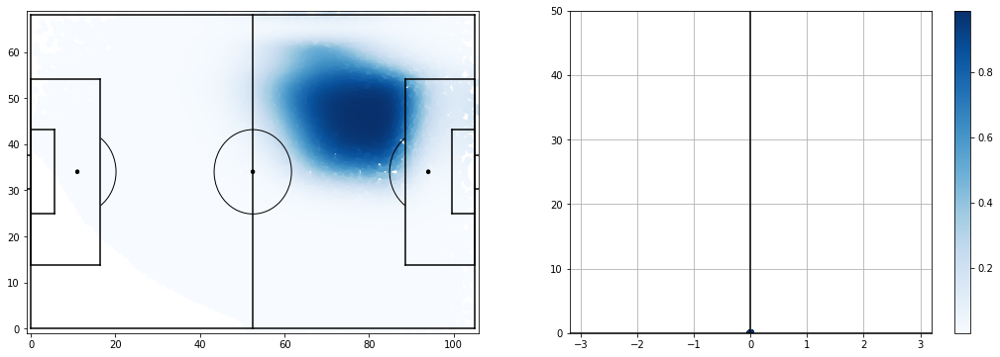

receival_2 17159 2191.7518816686725


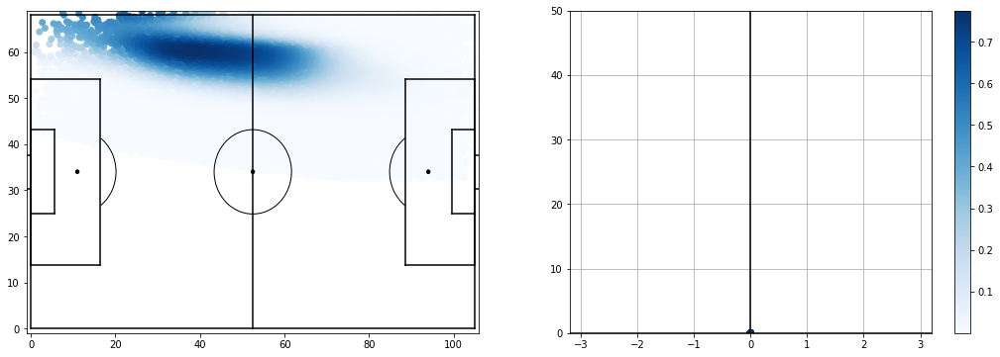

receival_3 8593 2464.784764127869


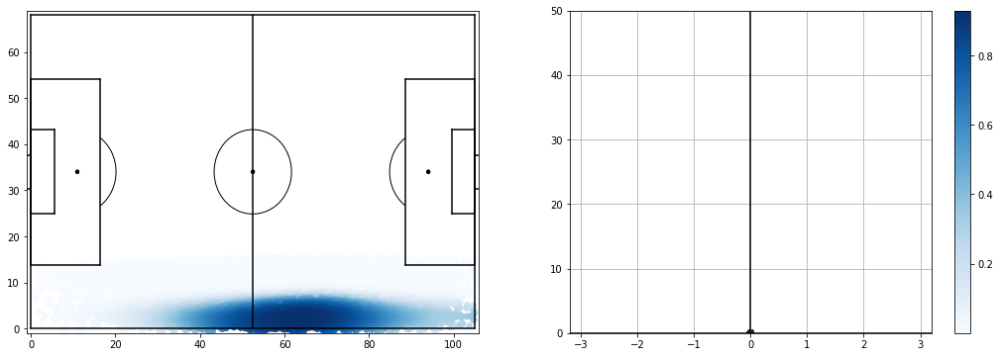

receival_4 30562 2254.991966138939


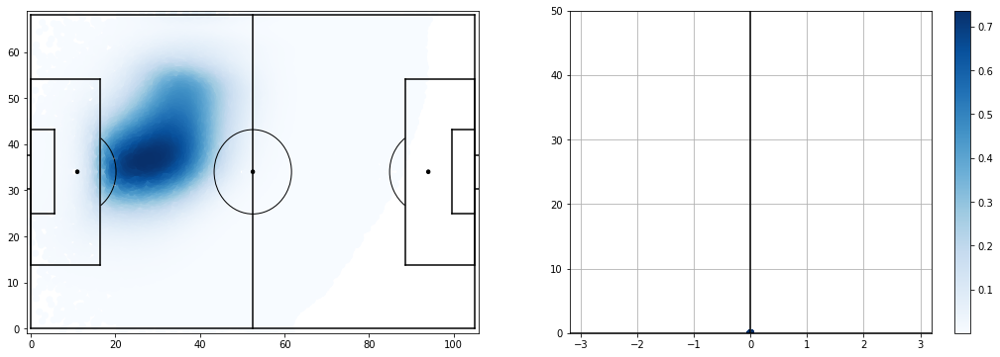

receival_5 8623 2770.228306729995


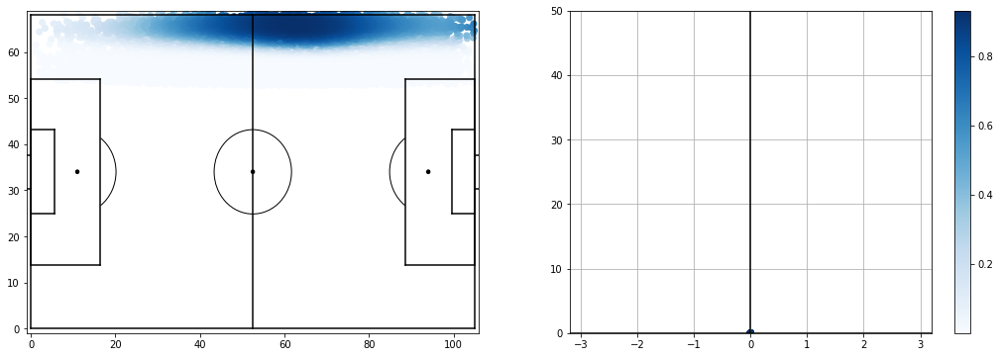

receival_6 15850 2107.0099072939065


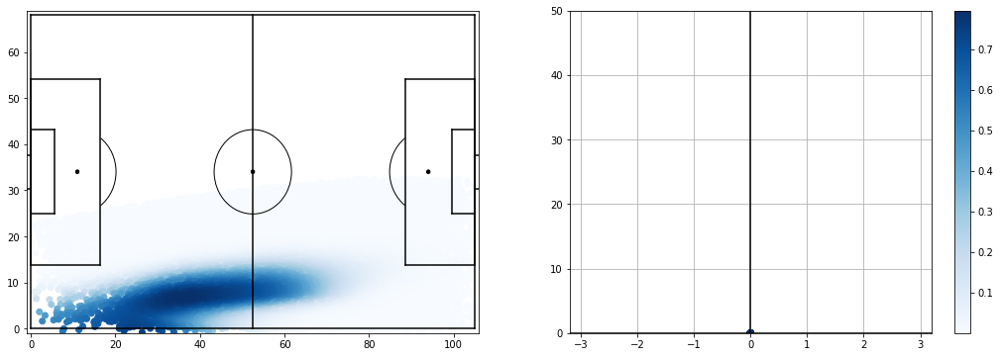

receival_7 35300 3844.4452973404673


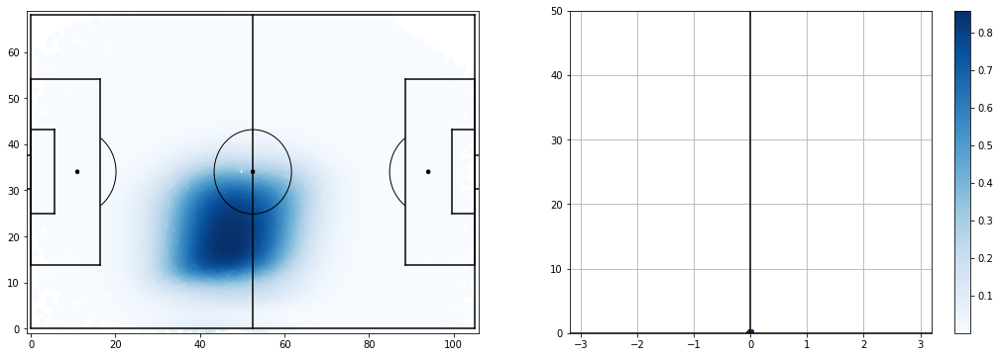

receival_8 9048 1091.1521438578707


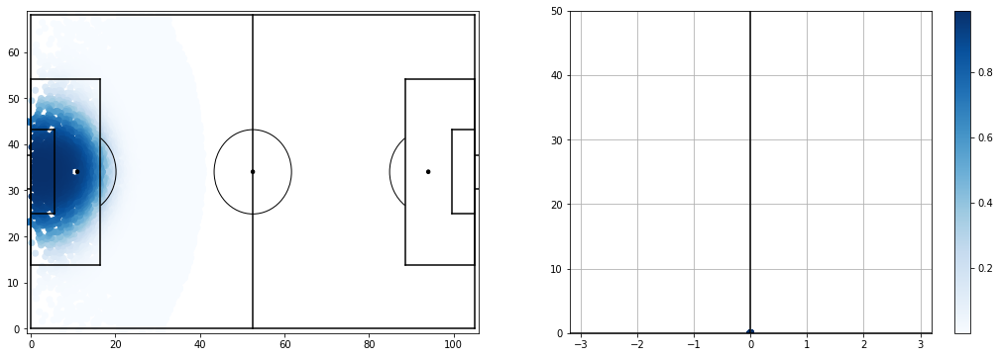

receival_9 11606 1351.6036038897985


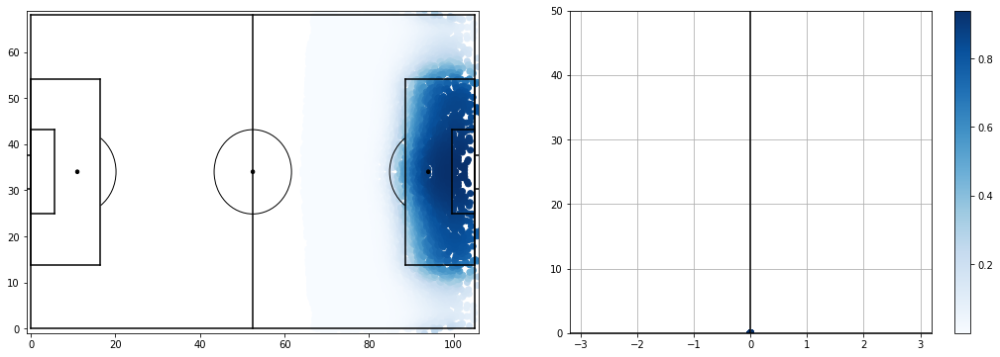

receival_10 27571 1816.5850216290162


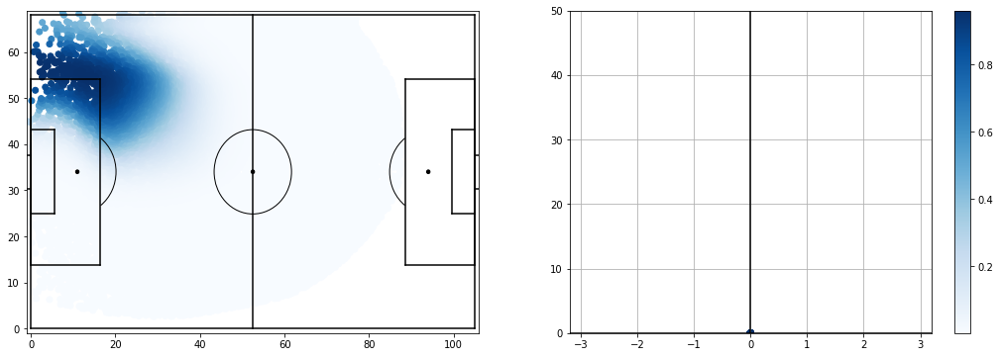

receival_11 34700 3872.5362077703357


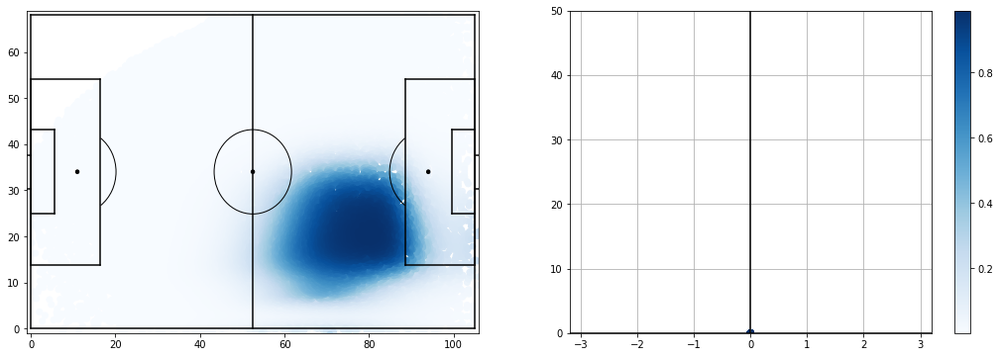

receival_12 35658 3580.505468511478


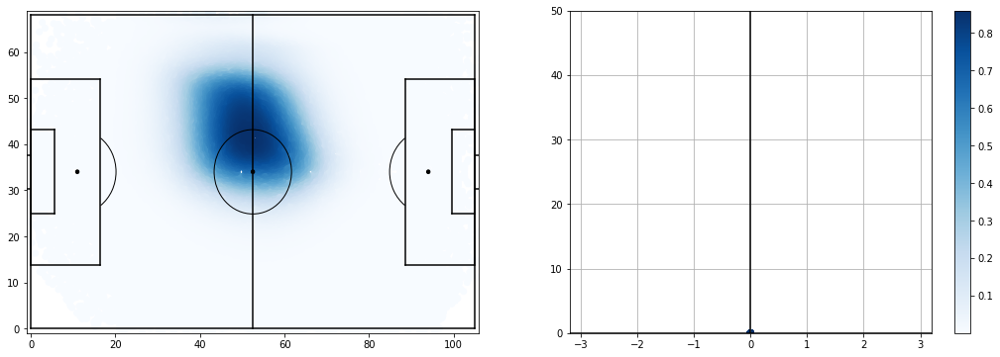

receival_13 12572 1110.866087383003


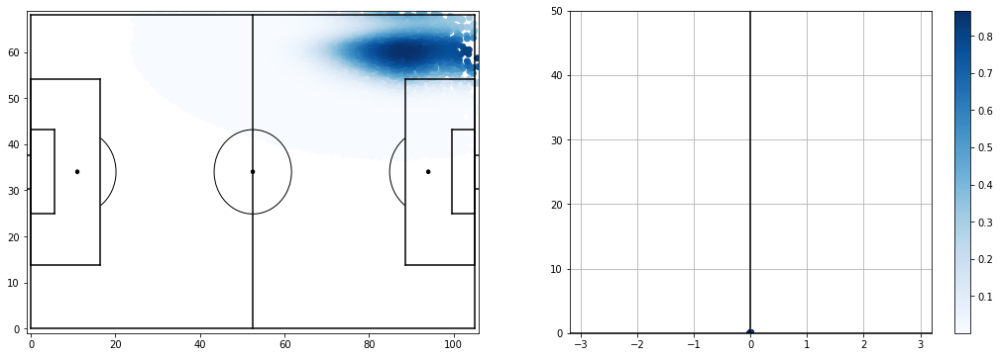

receival_14 11943 1129.0575453057165


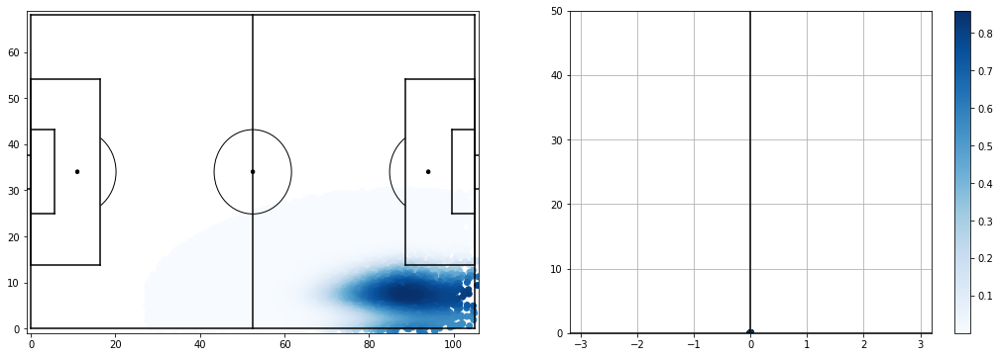

goal_0 122 122.0


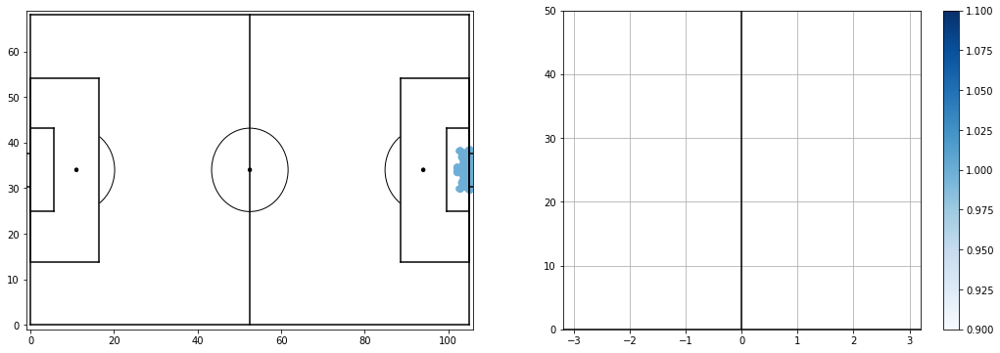

shot_0 1122 316.5992063572048


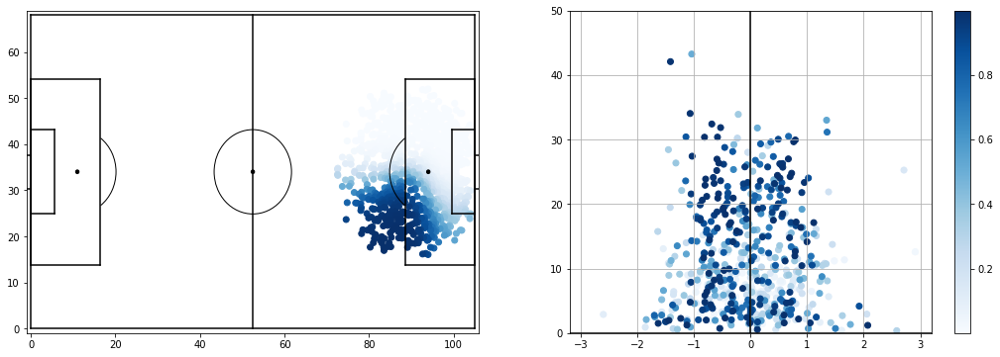

shot_1 1122 310.3680186916434


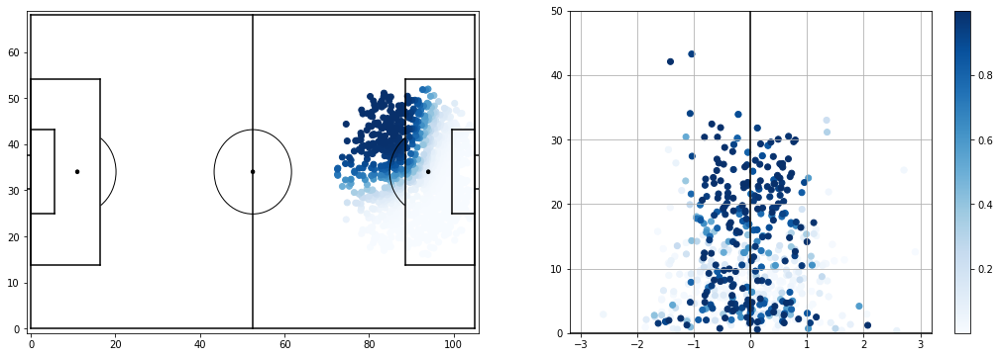

shot_2 1110 495.03277495115225


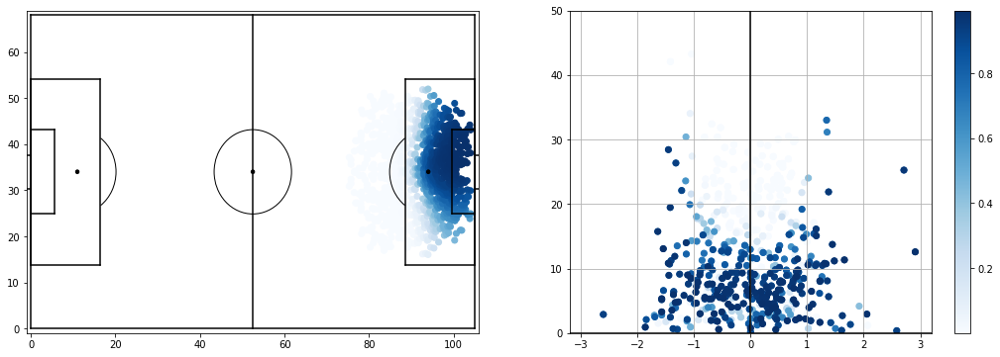

tackle_0 1506 302.8076141608584


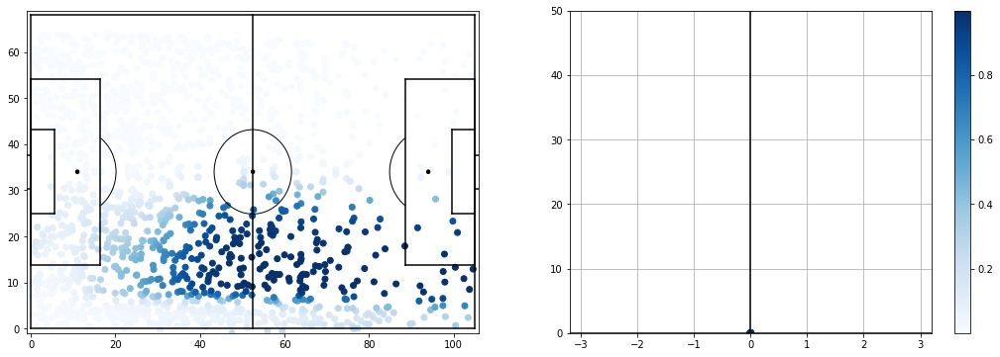

tackle_1 1672 358.5467667859728


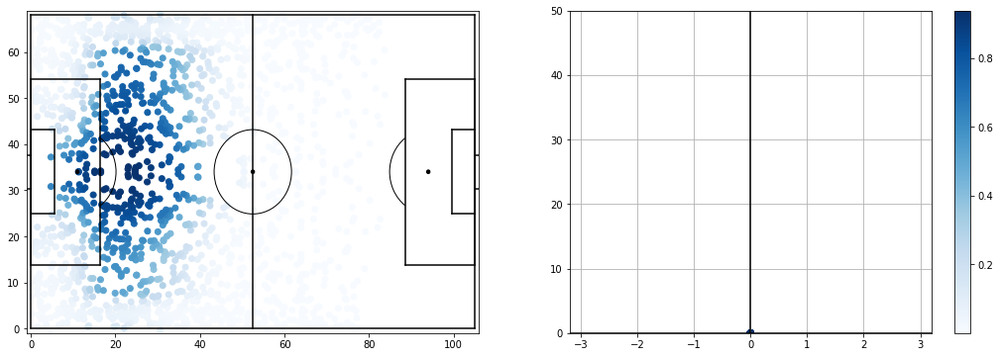

tackle_2 539 267.44367367287765


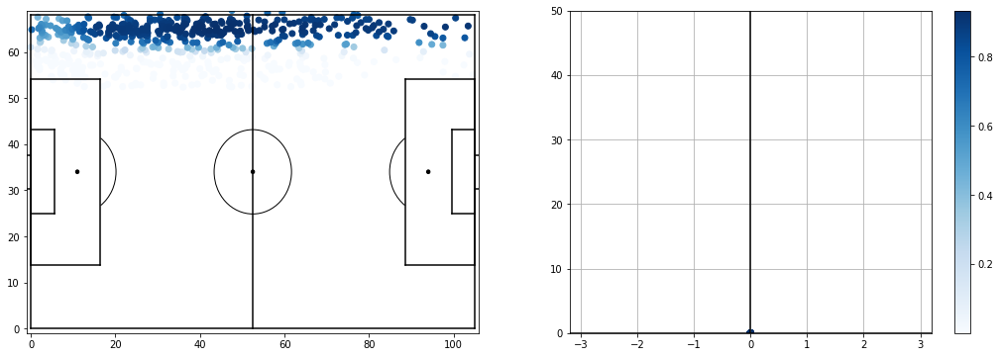

tackle_3 524 259.48175959030857


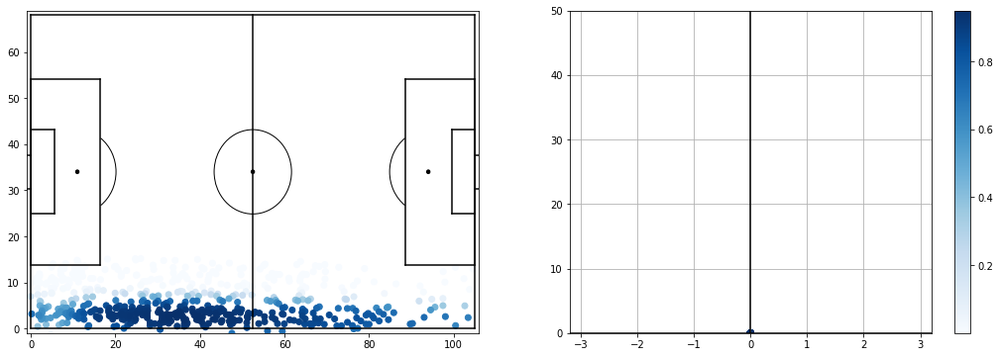

tackle_4 1756 317.3601571874966


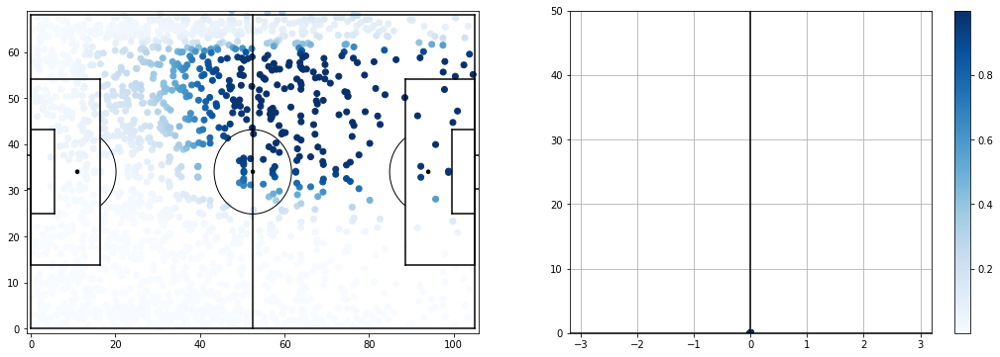

tackle_5 782 132.11962933954655


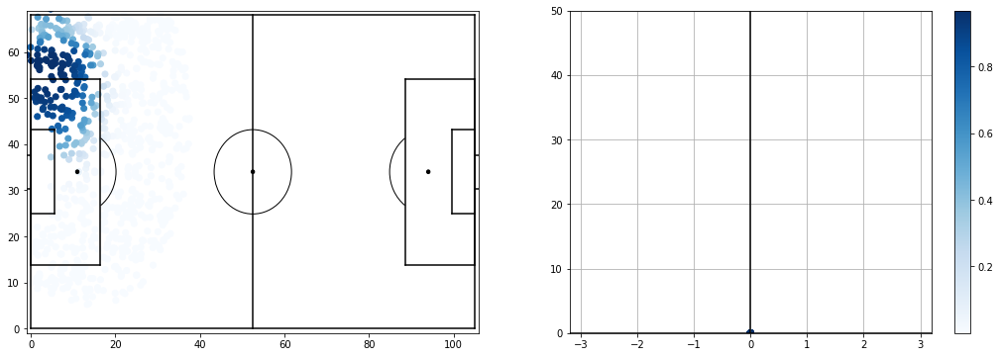

tackle_6 726 118.240399262939


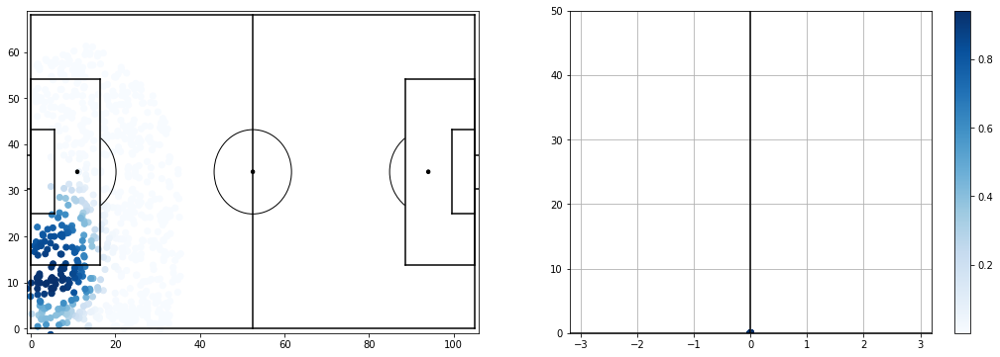

interception_0 8731 1262.7595164961388


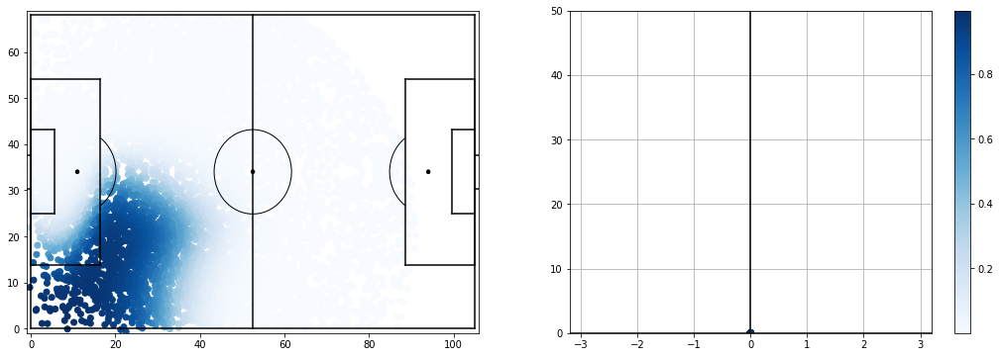

interception_1 7359 1234.3968512215065


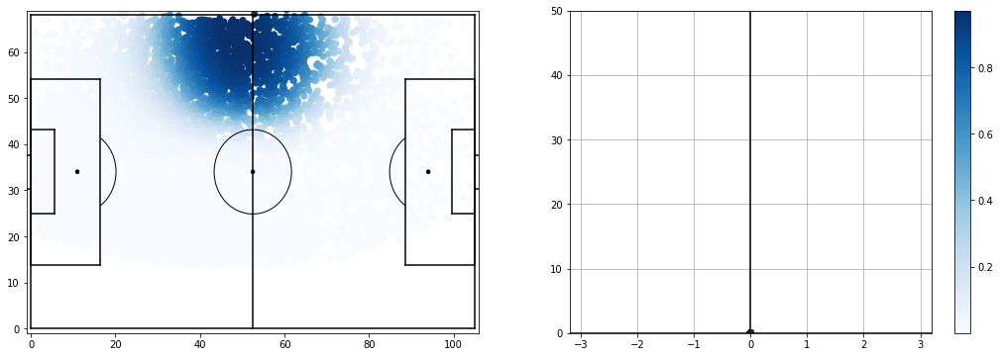

interception_2 9003 744.65231511157


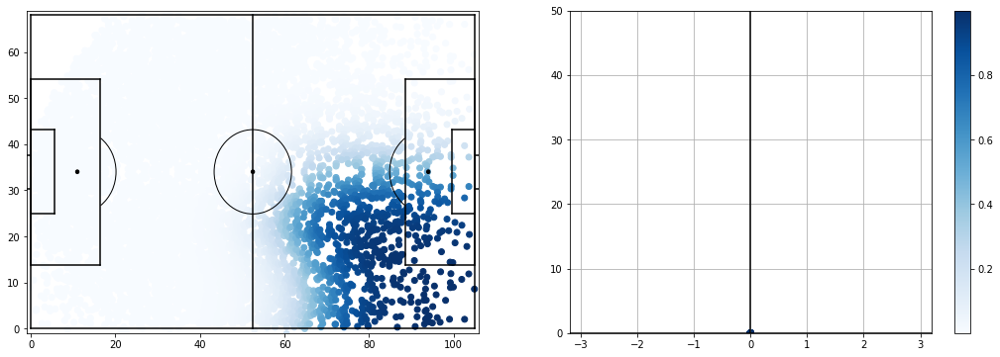

interception_3 3940 1424.6921801662622


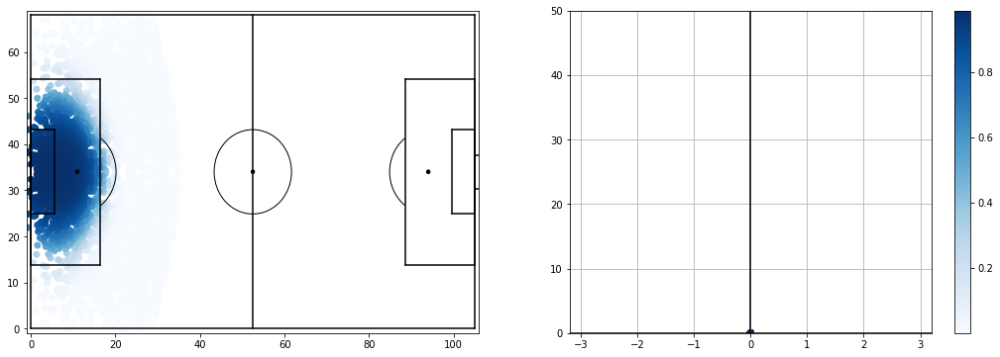

interception_4 7400 1246.028878631839


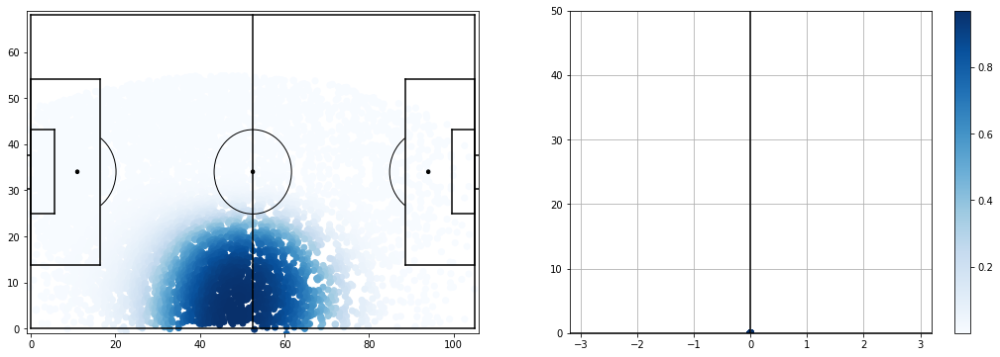

interception_5 8763 1281.2070654507747


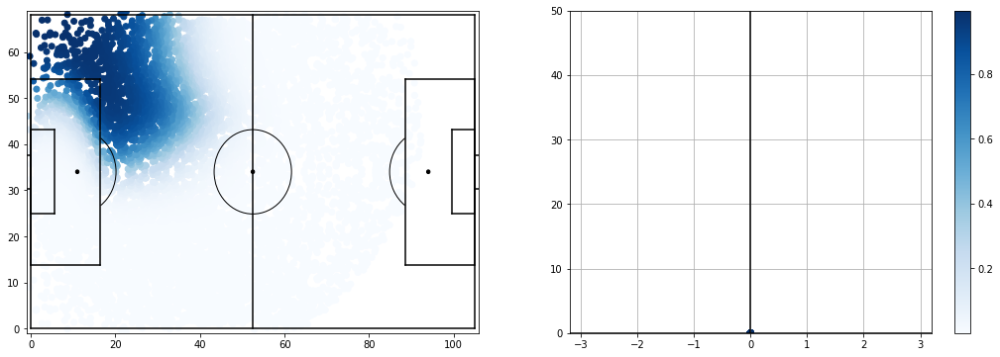

interception_6 8969 734.7493257387341


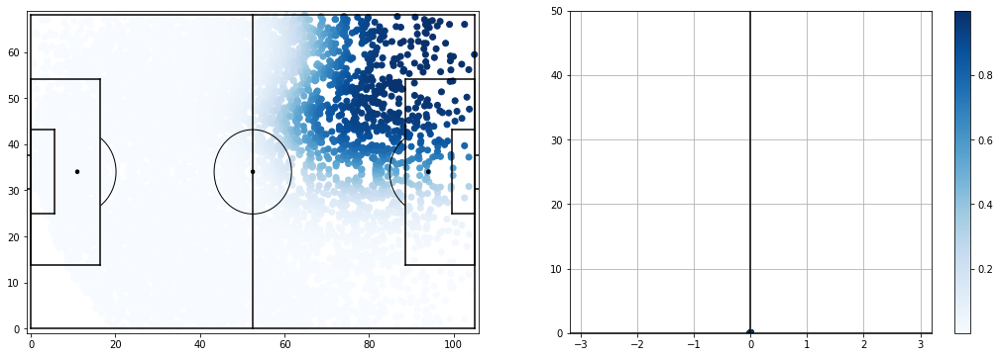

interception_7 9106 1177.5138671831535


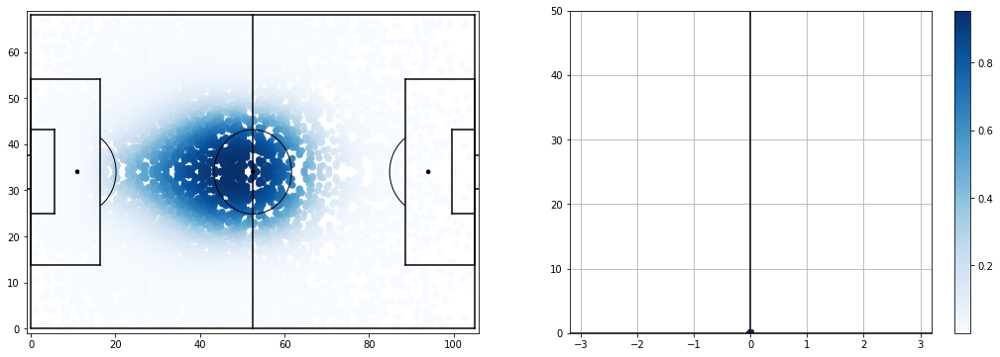

corner_0 228 228.0


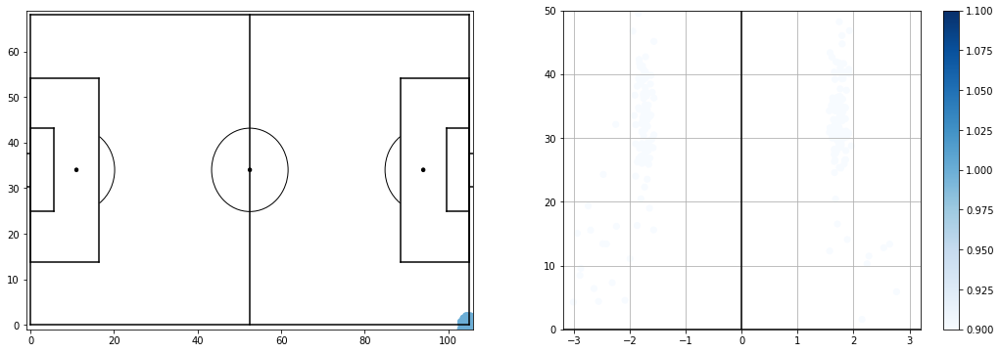

corner_1 228 228.0


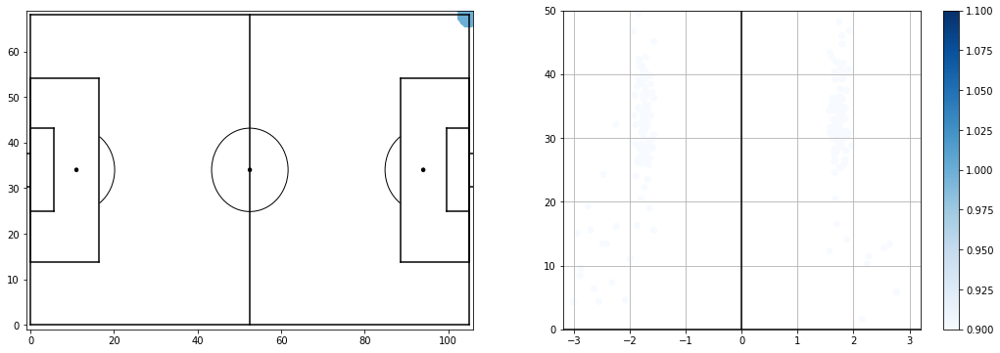

yellow_card_0 132 132.0


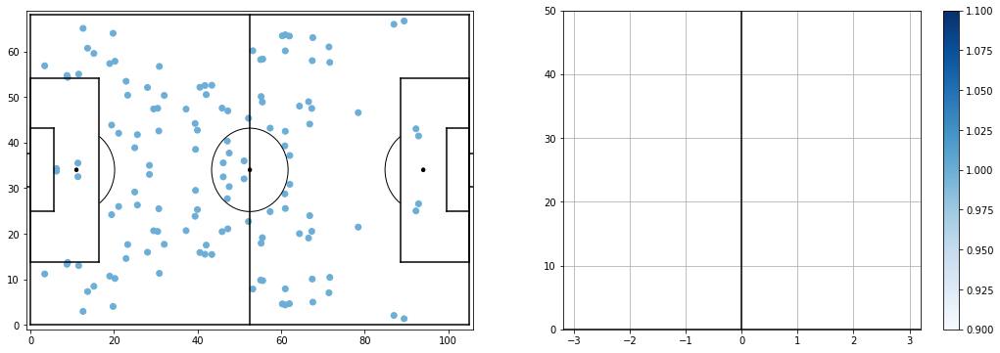

freekick_0 1080 453.2962949100229


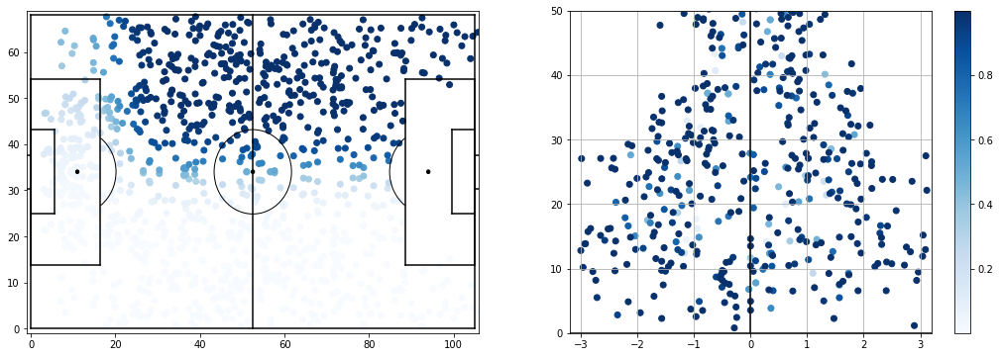

freekick_1 1080 453.5639493778617


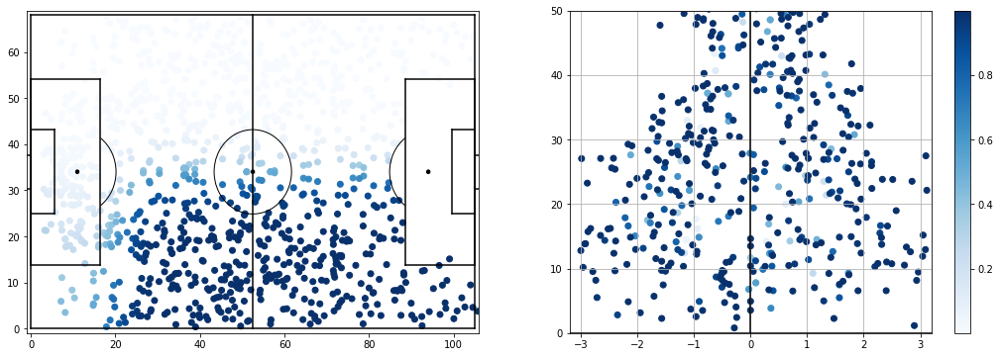

freekick_2 588 173.1397557121156


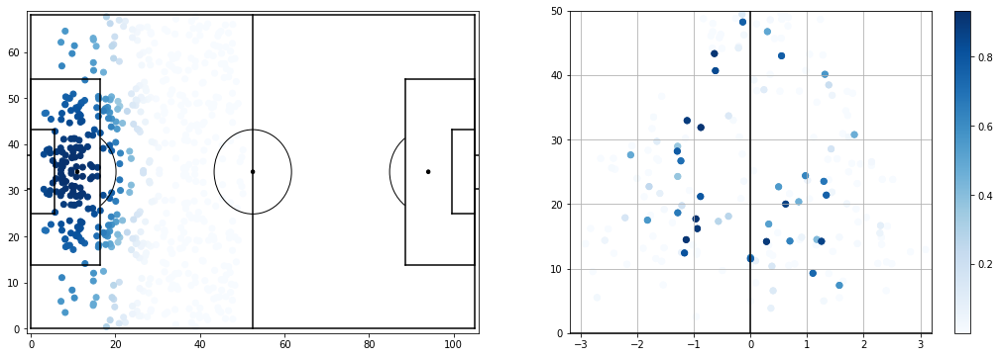

goalkick_0 688 344.00000000000375


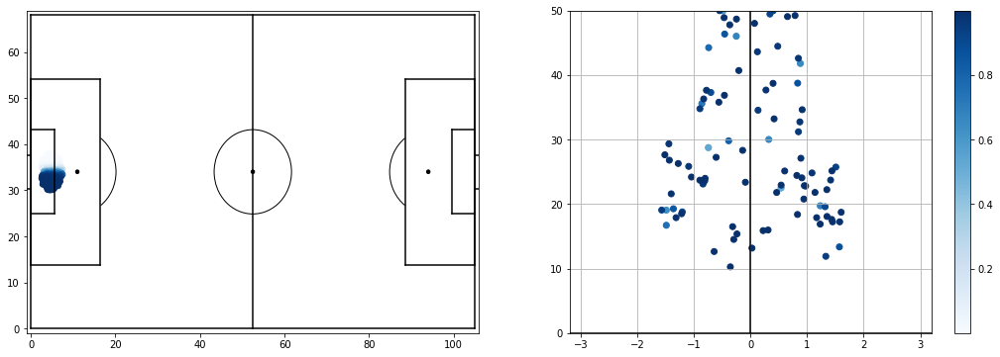

goalkick_1 688 343.9999999999964


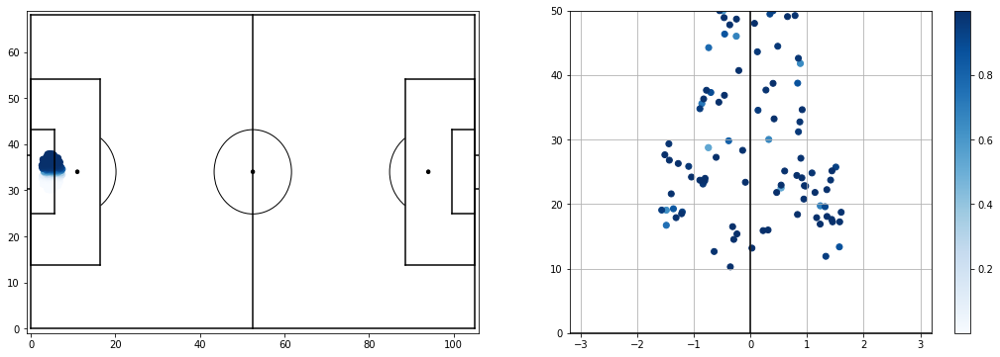

dribble_0 2111 628.5599087671807


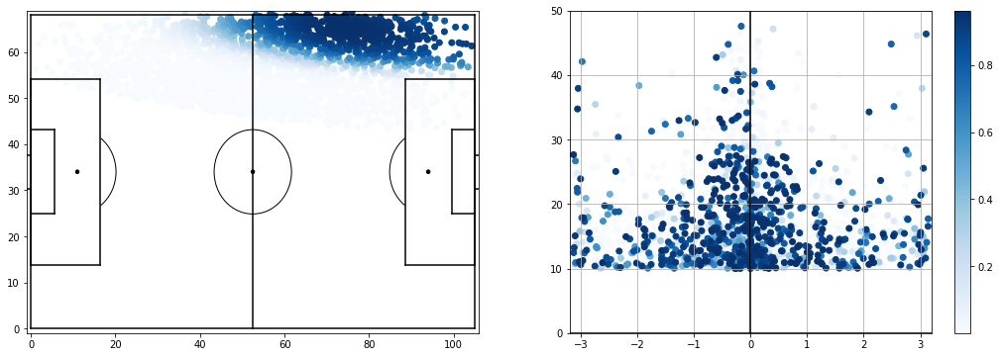

dribble_1 4886 894.9603709997805


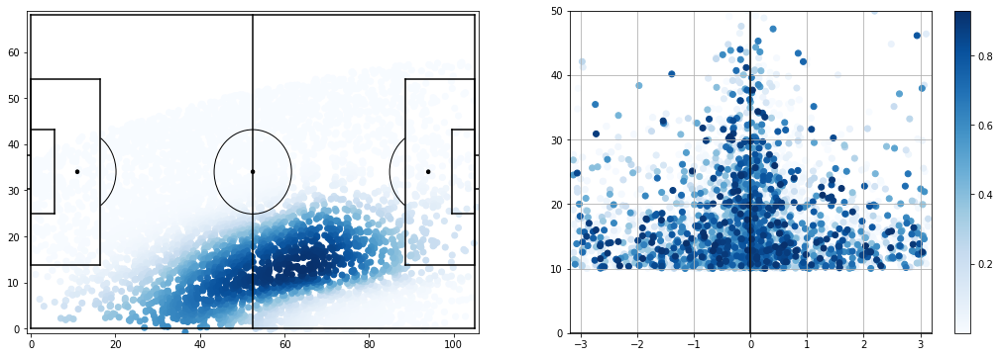

dribble_2 6374 901.5568153154898


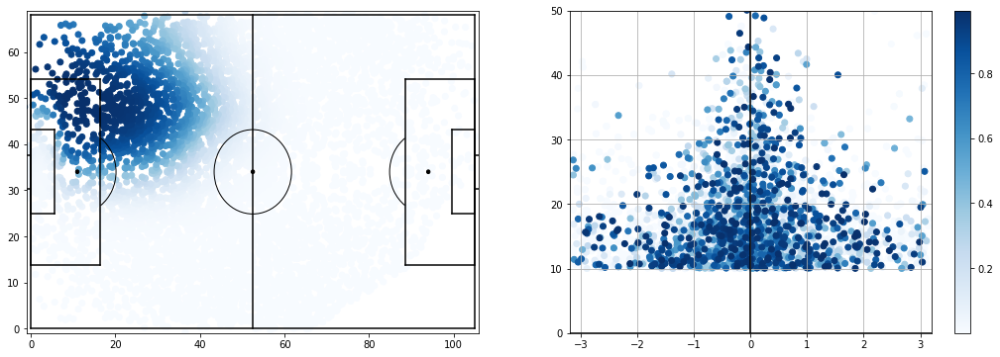

dribble_3 2108 629.7222873599378


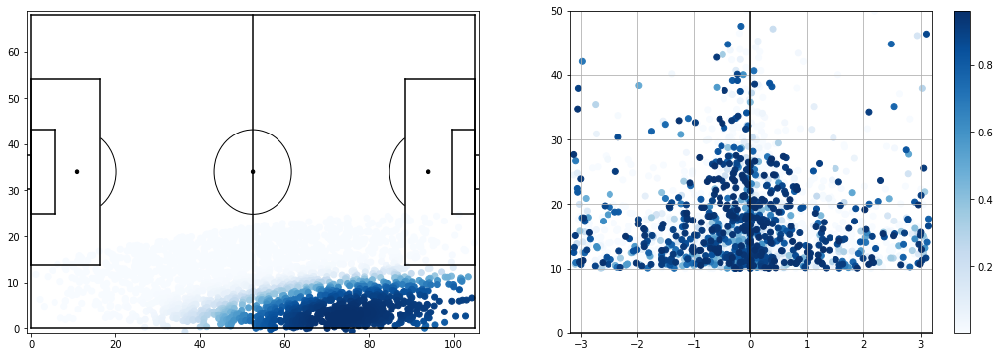

dribble_4 535 178.99149938310936


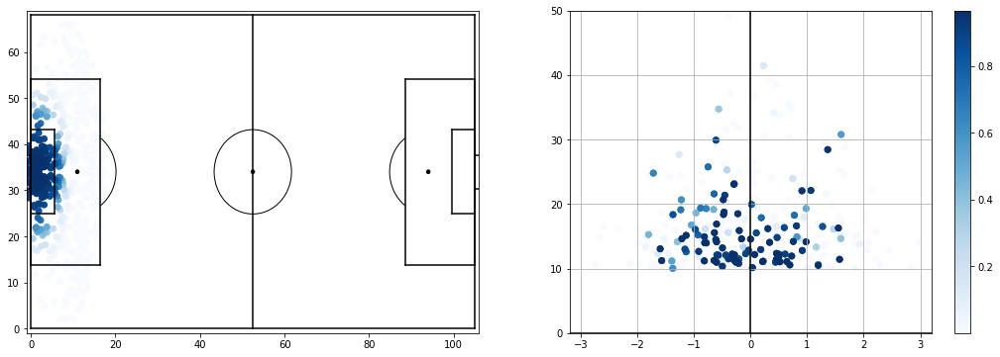

dribble_5 4890 889.6740802601695


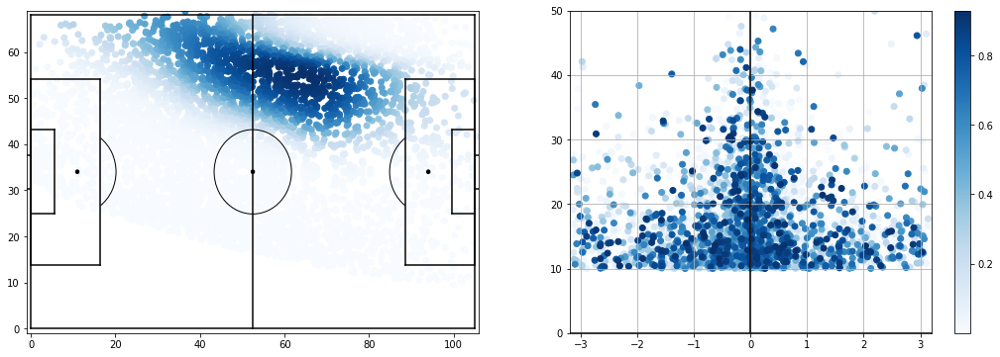

dribble_6 6742 1157.8887871035095


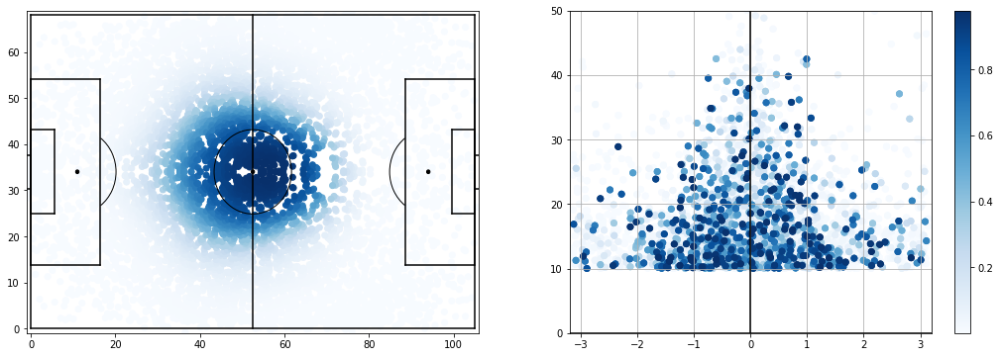

dribble_7 6383 897.4504100744857


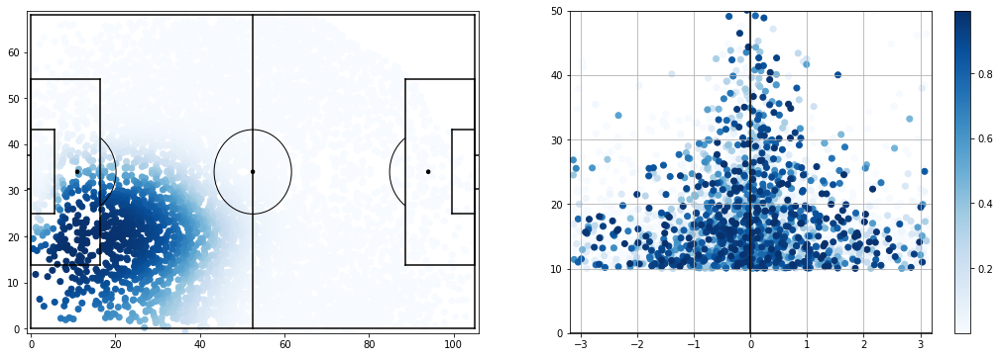

dribble_8 5880 563.1958407363269


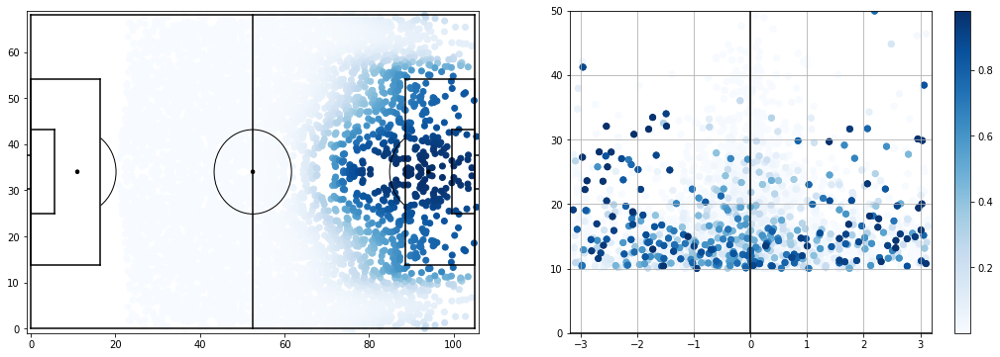

take_on_0 616 248.27402113899623


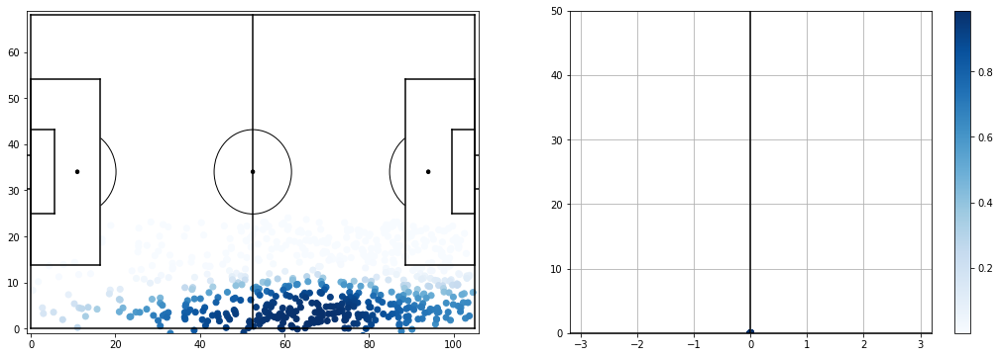

take_on_1 626 258.8945552871647


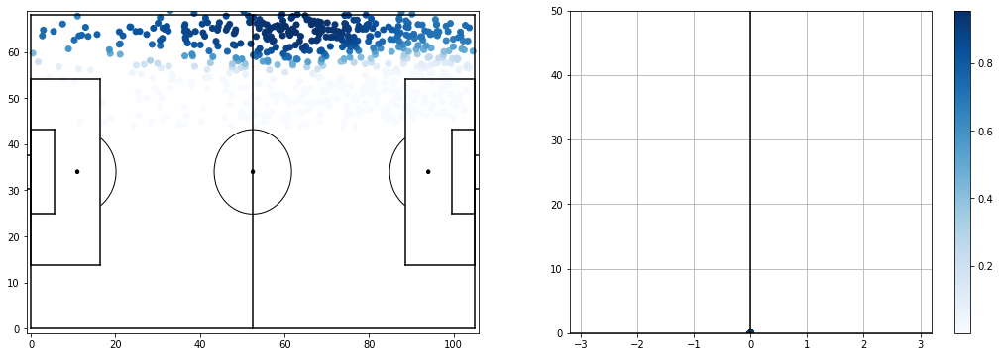

take_on_2 1505 303.7281582012147


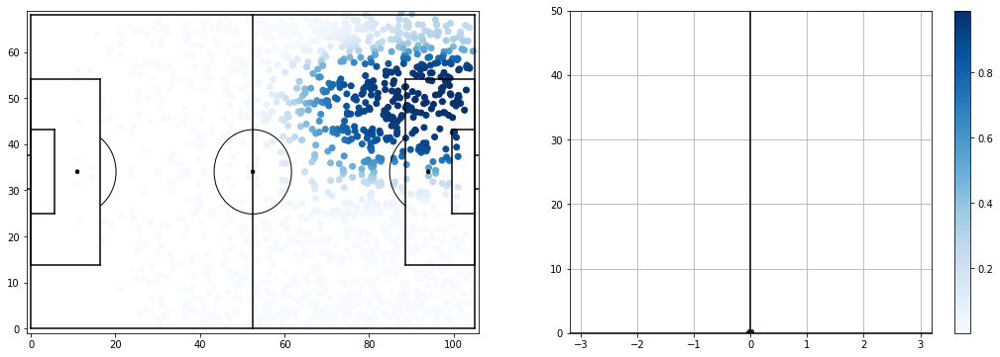

take_on_3 1474 268.3014954616984


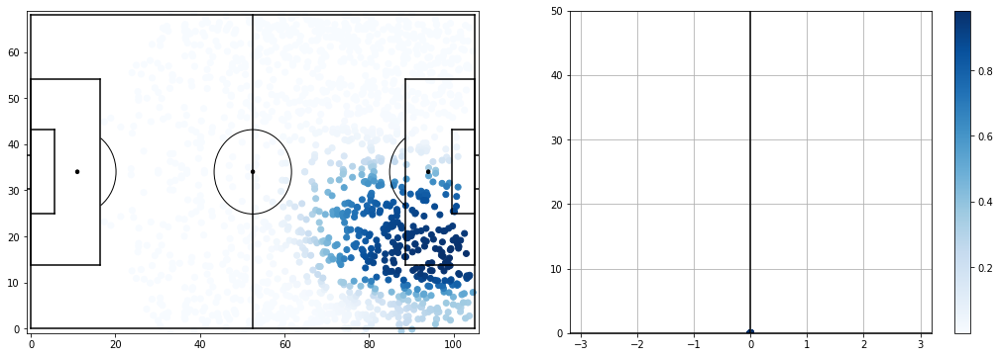

take_on_4 1550 263.07729890399037


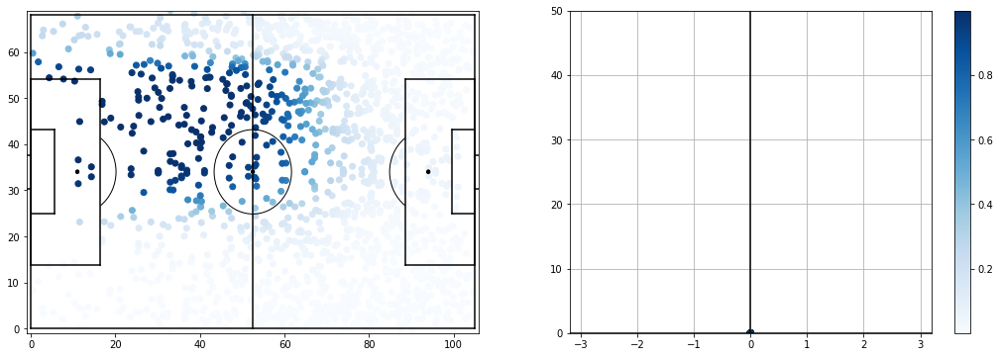

take_on_5 1353 207.72447100693583


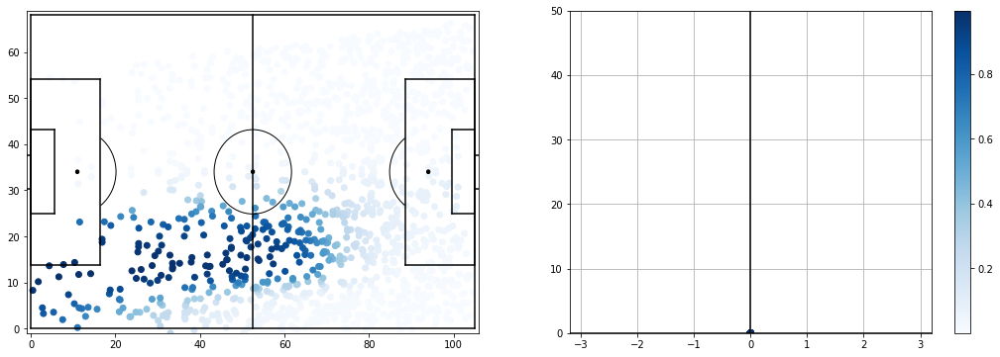

cross_0 484 172.7544063132086


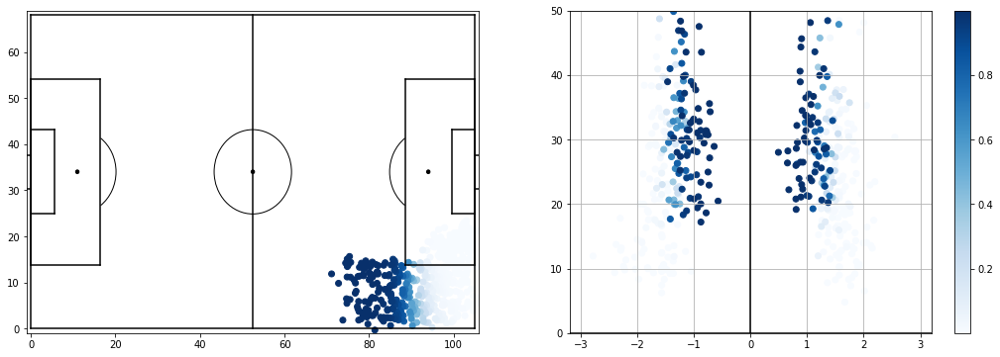

cross_1 484 194.35116072472448


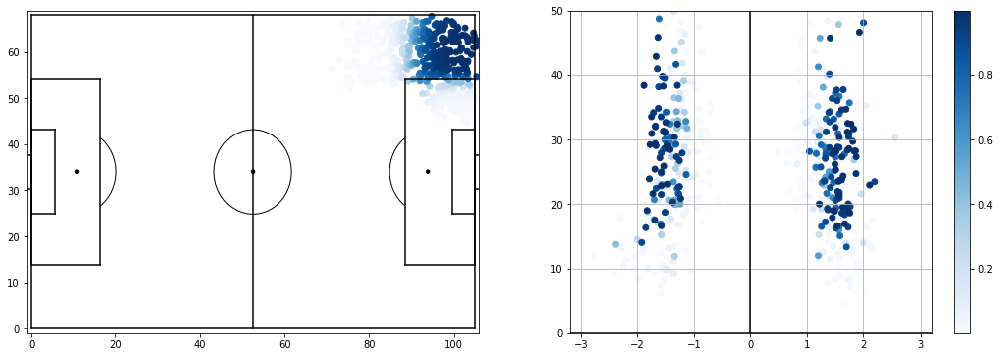

cross_2 484 194.35116072472664


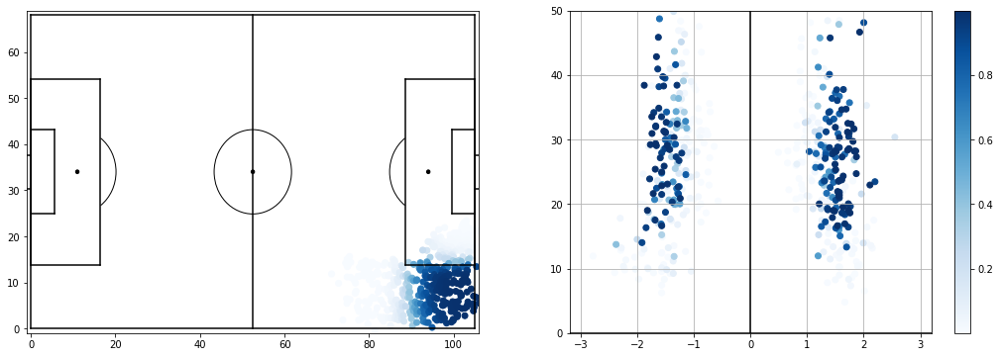

cross_3 484 172.754406313211


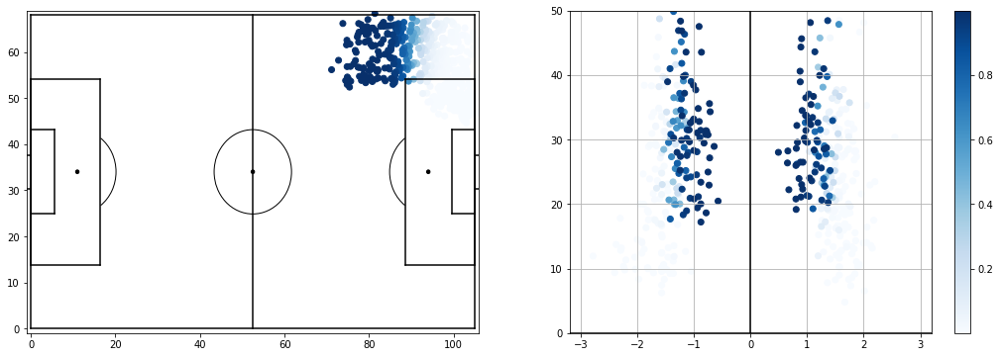

cross_4 392 116.89443296206471


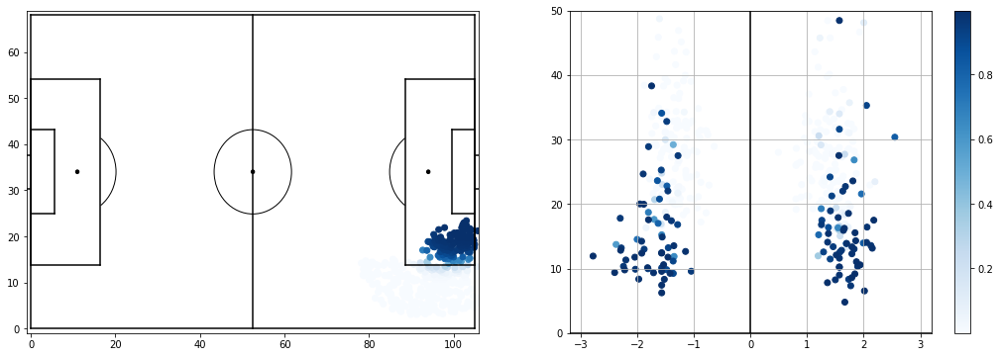

cross_5 392 116.8944329620644


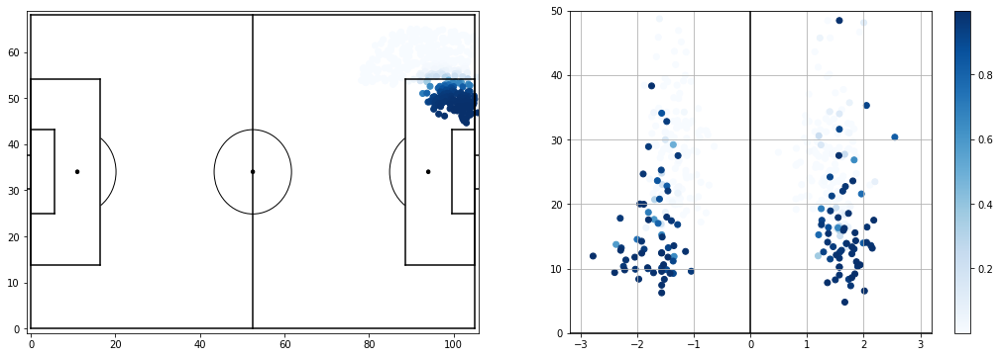

bad_touch_0 1142 218.96327194630345


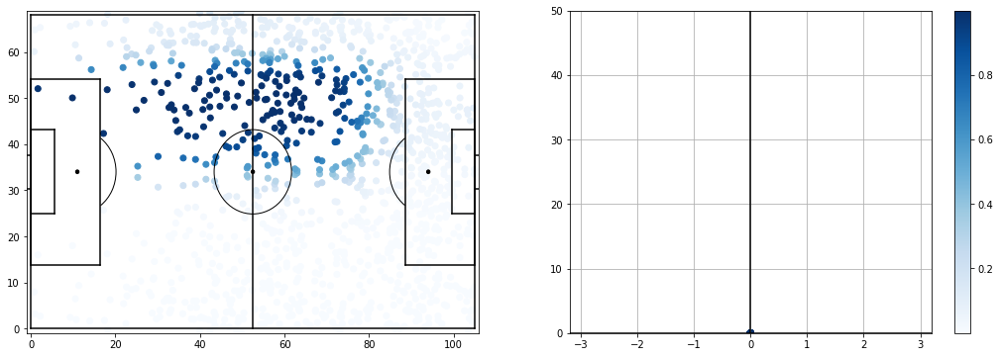

bad_touch_1 1142 216.76567792049624


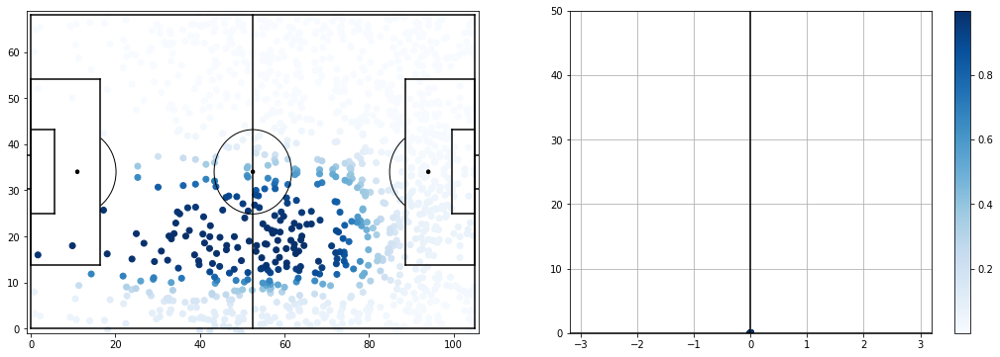

bad_touch_2 872 178.5150305826094


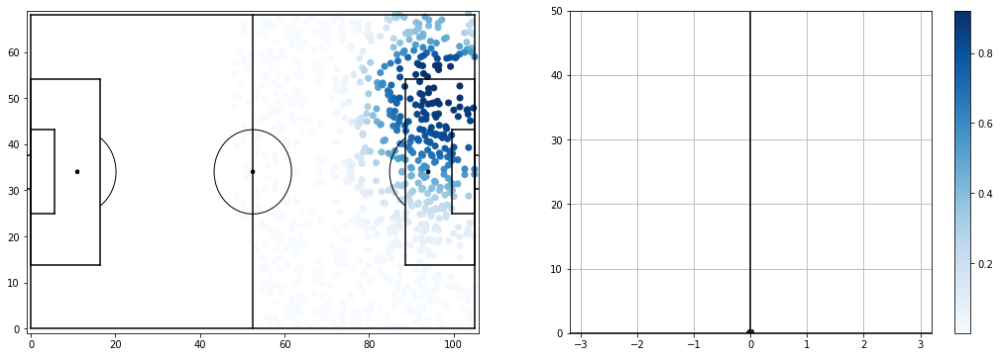

bad_touch_3 975 185.9972954683354


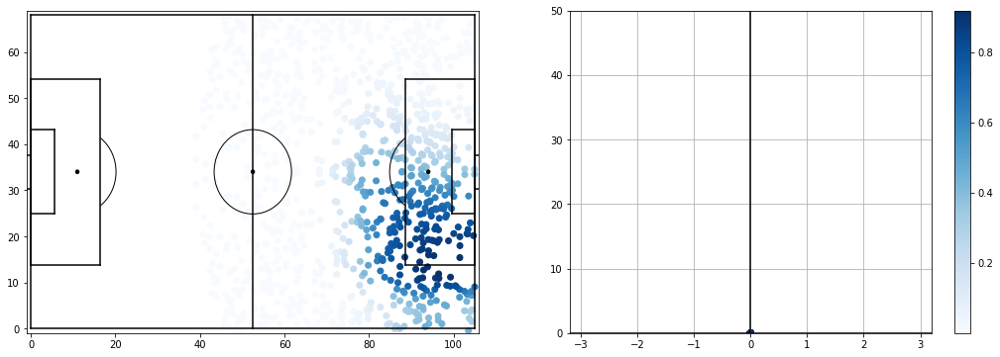

bad_touch_4 445 171.71684088125477


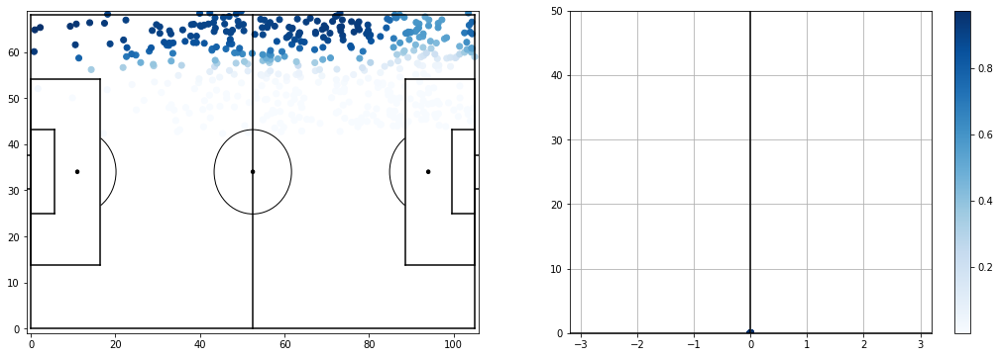

bad_touch_5 440 170.0418832010002


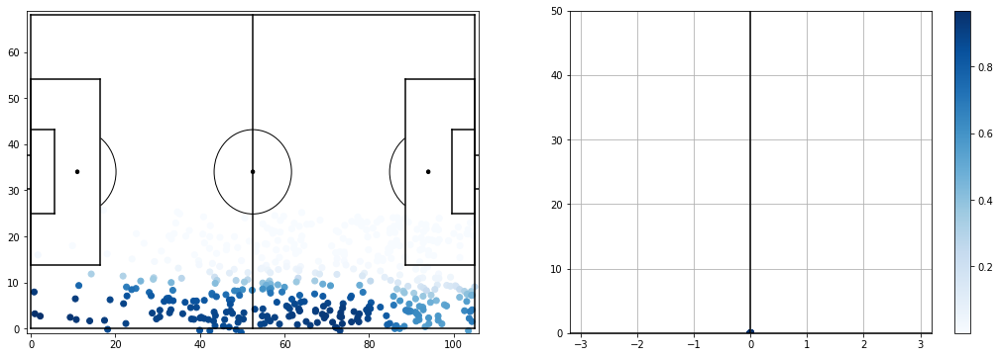

throw_in_0 792 303.38043553684025


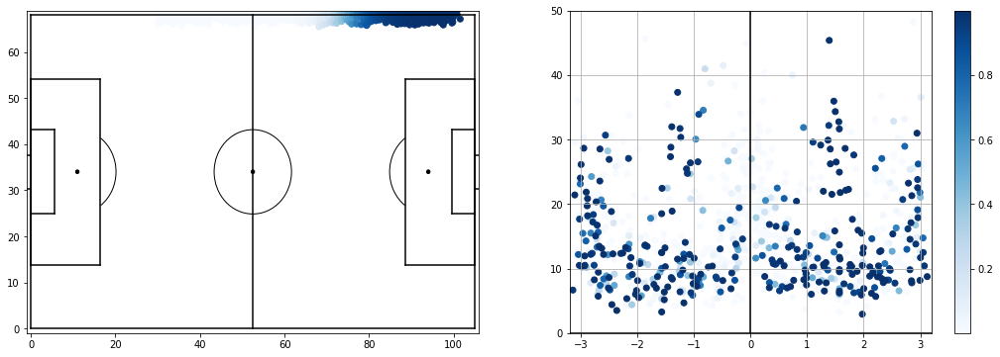

throw_in_1 983 349.5511844746322


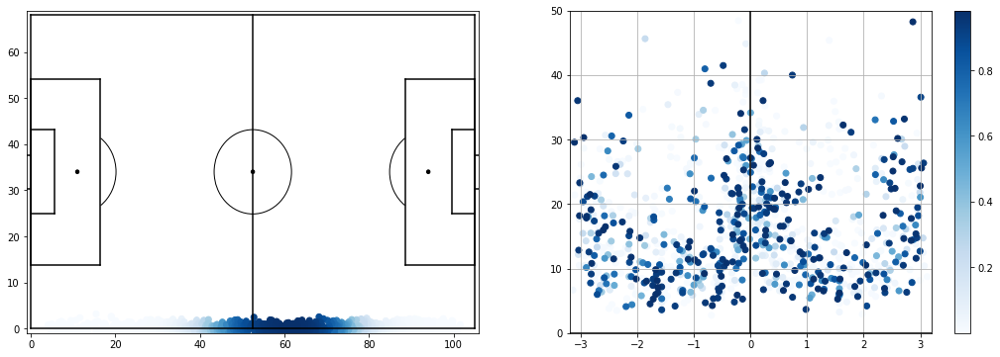

throw_in_2 983 328.9767061437206


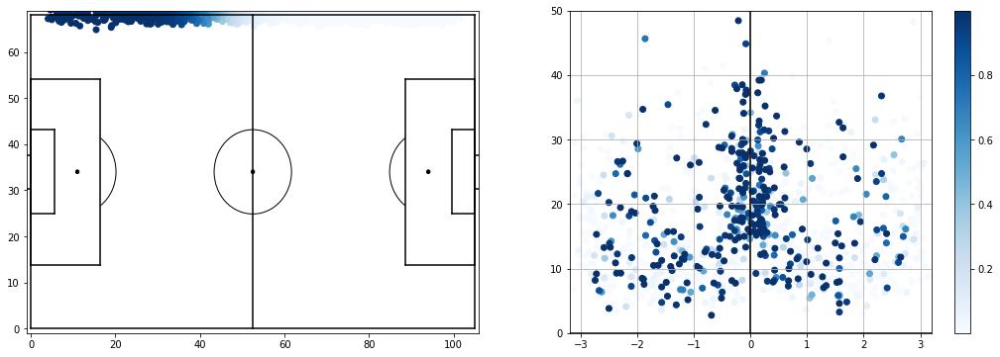

throw_in_3 983 333.77240663148274


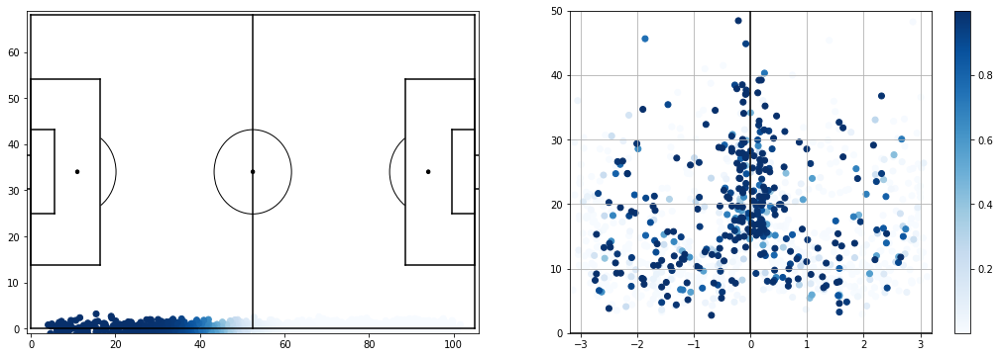

throw_in_4 983 350.6428583194386


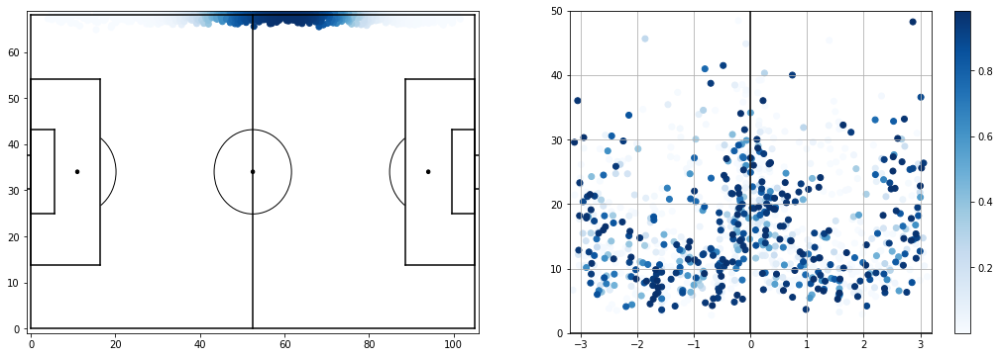

throw_in_5 779 299.6764088938854


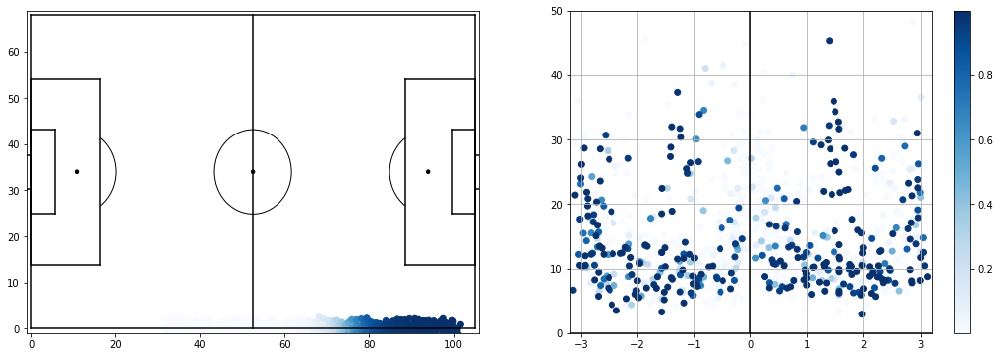

out_0 420 271.28236908735494


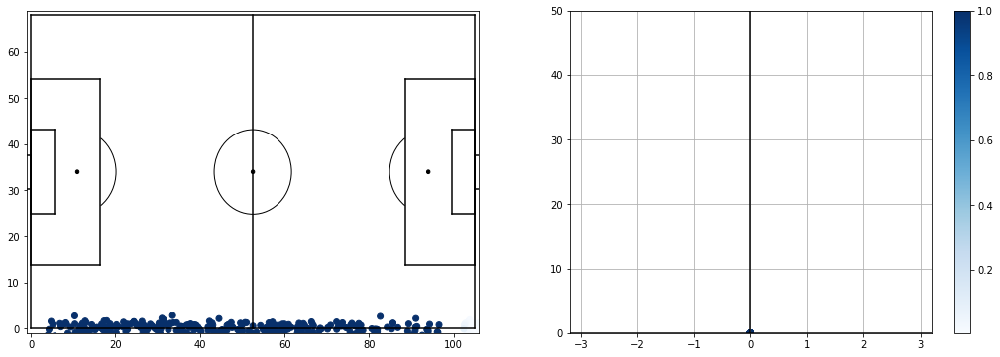

out_1 420 271.28236908735505


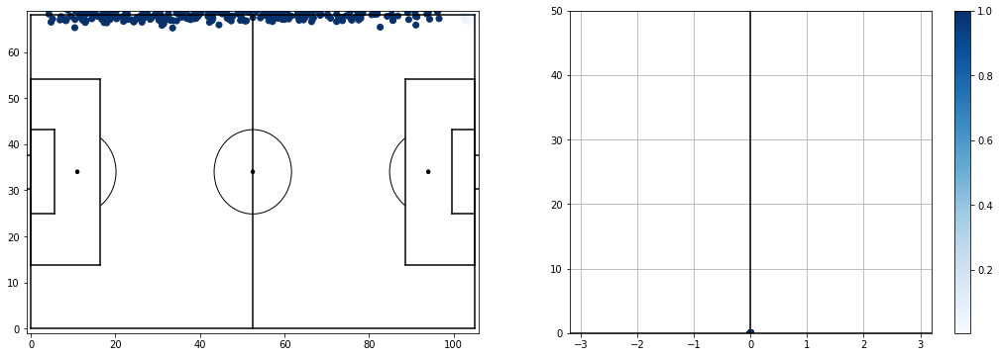

out_2 150 148.71763091264506


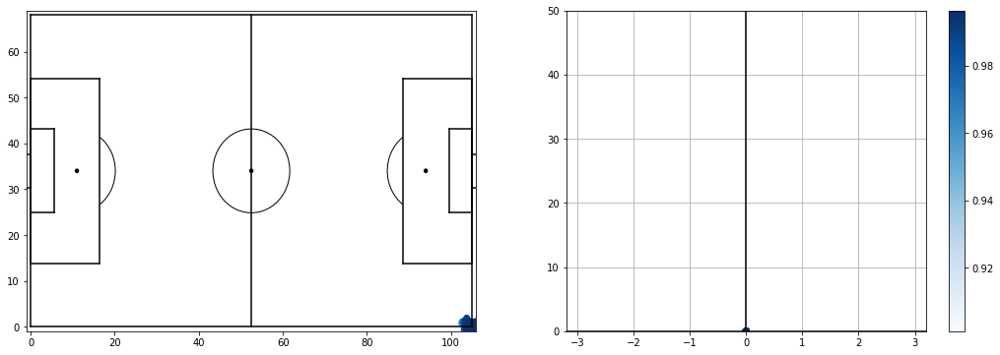

out_3 150 148.71763091264503


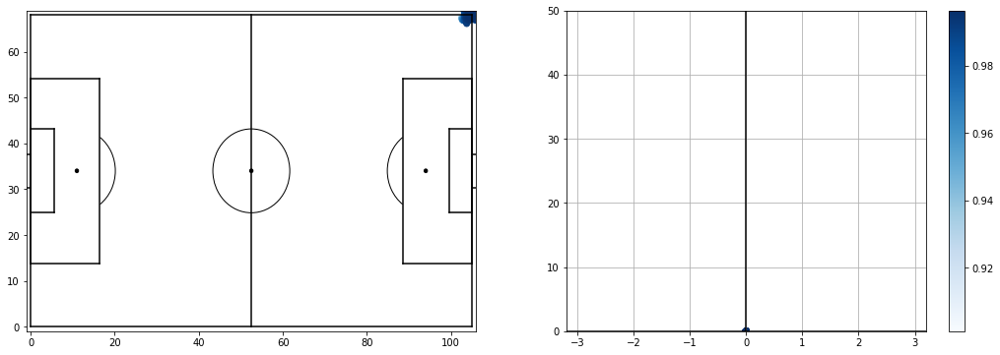

In [161]:
for column in w_i.columns:
    probs = w_i[column]
    pos_prob_idx = probs > 1e-10
    print(column,sum(pos_prob_idx),sum(probs))
    dfc = a.reset_index()[pos_prob_idx].copy()
    dfc["membership"] = probs[pos_prob_idx]
    dfc = dfc.sort_values("membership",ascending=True)

    axs = vis.axesxypolar()
    sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
    plt.colorbar(sc)
    #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    axs[1].scatter(dfc.mov_angle_a0,dfc.mov_d_a0,c=dfc.membership,cmap="Blues")
    plt.show()

In [ ]:
def bic(models):
    n_data = sum(m.weights.sum() for m in models)
    n_parameters = sum(m._n_parameters() for m in models)
    L = sum(m.likelihood for m in models)
    tu = np.log(n_data) * n_parameters, np.log(n_data) * n_parameters - 2 * L
    return tu[1]

x = []
y = []
for i in tqdm.tqdm(list(range(5,100))):
    models_ll = pat.ilp_select_models_likelihood(can_i,i,verbose=False)
    x.append(i)
    y.append(bic(models_ll))

plt.plot(x,y)
plt.show()

In [ ]:
#plt.hist(np.nan_to_num((a.dy / a.dx),nan=2),bins=100)
#plt.show()
# plt.hist(a.mov_angle_a0,bins=200)
# plt.show()
b = a[:2000]
plt.scatter(b.dx,b.dy,c=b.mov_angle_a0,cmap="jet")
plt.colorbar()
plt.show()

In [148]:
cols_ii = [#"x","y",
        #"dx","dy"
        #"dist_to_goal_a0",
        #"angle_to_goal_a0",
        #"mov_d_a0",
        "mov_angle_a0"
        #"dx_a0",
        #"dy_a0"
       ]
w_i = probabilities(models_i)
can_ii = candidates(a,cols_ii,w_i,n=5)








pass_0:   0%|          | 0/5 [00:00<?, ?it/s]






pass_0:  20%|██        | 1/5 [00:00<00:00,  7.89it/s]






pass_0:  40%|████      | 2/5 [00:00<00:00,  4.14it/s]






pass_0:  60%|██████    | 3/5 [00:01<00:00,  2.38it/s]






pass_0:  80%|████████  | 4/5 [00:02<00:00,  1.77it/s]






pass_0: 100%|██████████| 5/5 [00:03<00:00,  1.30it/s]













pass_1:   0%|          | 0/5 [00:00<?, ?it/s]






pass_1:  20%|██        | 1/5 [00:00<00:00,  8.64it/s]






pass_1:  40%|████      | 2/5 [00:00<00:00,  4.51it/s]






pass_1:  60%|██████    | 3/5 [00:01<00:00,  2.26it/s]






pass_1:  80%|████████  | 4/5 [00:02<00:00,  1.64it/s]






pass_1: 100%|██████████| 5/5 [00:04<00:00,  1.11it/s]













pass_2:   0%|          | 0/5 [00:00<?, ?it/s]






pass_2:  20%|██        | 1/5 [00:00<00:00,  9.95it/s]






pass_2:  40%|████      | 2/5 [00:00<00:00,  5.75it/s]






pass_2:  60%|██████    | 3/5 [00:00<00:00,  4.06it/s]






pass_2:  80%|████████  | 4/5 [00:01<00:00, 

pass_16: 100%|██████████| 5/5 [00:01<00:00,  3.85it/s]













pass_17:   0%|          | 0/5 [00:00<?, ?it/s]






pass_17:  40%|████      | 2/5 [00:00<00:00,  4.05it/s]






pass_17:  60%|██████    | 3/5 [00:00<00:00,  3.78it/s]






pass_17:  80%|████████  | 4/5 [00:01<00:00,  2.43it/s]






pass_17: 100%|██████████| 5/5 [00:02<00:00,  1.77it/s]













pass_18:   0%|          | 0/5 [00:00<?, ?it/s]






pass_18:  40%|████      | 2/5 [00:00<00:01,  2.98it/s]






pass_18:  60%|██████    | 3/5 [00:01<00:00,  2.96it/s]






pass_18:  80%|████████  | 4/5 [00:01<00:00,  2.15it/s]






pass_18: 100%|██████████| 5/5 [00:02<00:00,  1.78it/s]













pass_19:   0%|          | 0/5 [00:00<?, ?it/s]






pass_19:  40%|████      | 2/5 [00:00<00:00, 12.61it/s]






pass_19:  60%|██████    | 3/5 [00:00<00:00,  8.74it/s]






pass_19:  80%|████████  | 4/5 [00:00<00:00,  5.92it/s]






pass_19: 100%|██████████| 5/5 [00:00<00:00,  4.92it/s]













keeper_catch_0:   0%

receival_8:  20%|██        | 1/5 [00:00<00:00,  6.84it/s]






receival_8:  40%|████      | 2/5 [00:00<00:00,  4.60it/s]






receival_8:  60%|██████    | 3/5 [00:01<00:00,  2.62it/s]






receival_8:  80%|████████  | 4/5 [00:02<00:00,  1.69it/s]






receival_8: 100%|██████████| 5/5 [00:03<00:00,  1.22it/s]













receival_9:   0%|          | 0/5 [00:00<?, ?it/s]






receival_9:  40%|████      | 2/5 [00:00<00:00,  7.21it/s]






receival_9:  60%|██████    | 3/5 [00:00<00:00,  5.00it/s]






receival_9:  80%|████████  | 4/5 [00:01<00:00,  3.42it/s]






receival_9: 100%|██████████| 5/5 [00:01<00:00,  2.56it/s]













receival_10:   0%|          | 0/5 [00:00<?, ?it/s]






receival_10:  20%|██        | 1/5 [00:00<00:00,  5.97it/s]






receival_10:  40%|████      | 2/5 [00:00<00:00,  3.97it/s]






receival_10:  60%|██████    | 3/5 [00:01<00:00,  2.29it/s]






receival_10:  80%|████████  | 4/5 [00:02<00:00,  1.52it/s]






receival_10: 100%|██████████| 5/5 [00

interception_3:  60%|██████    | 3/5 [00:00<00:00,  8.03it/s]






interception_3:  80%|████████  | 4/5 [00:00<00:00,  5.50it/s]






interception_3: 100%|██████████| 5/5 [00:01<00:00,  4.57it/s]













interception_4:   0%|          | 0/5 [00:00<?, ?it/s]






interception_4:  40%|████      | 2/5 [00:00<00:00, 12.84it/s]






interception_4:  60%|██████    | 3/5 [00:00<00:00,  8.52it/s]






interception_4:  80%|████████  | 4/5 [00:00<00:00,  6.12it/s]






interception_4: 100%|██████████| 5/5 [00:00<00:00,  4.94it/s]













interception_5:   0%|          | 0/5 [00:00<?, ?it/s]






interception_5:  40%|████      | 2/5 [00:00<00:00, 16.48it/s]






interception_5:  60%|██████    | 3/5 [00:00<00:00, 12.64it/s]






interception_5:  80%|████████  | 4/5 [00:00<00:00,  8.05it/s]






interception_5: 100%|██████████| 5/5 [00:00<00:00,  6.39it/s]













interception_6:   0%|          | 0/5 [00:00<?, ?it/s]






interception_6:  40%|████      | 2/5 [00:00<00:00, 

dribble_7:  80%|████████  | 4/5 [00:01<00:00,  2.36it/s]






dribble_7: 100%|██████████| 5/5 [00:02<00:00,  1.85it/s]













dribble_8:   0%|          | 0/5 [00:00<?, ?it/s]






dribble_8:  40%|████      | 2/5 [00:00<00:00,  7.09it/s]






dribble_8:  60%|██████    | 3/5 [00:00<00:00,  6.12it/s]






dribble_8:  80%|████████  | 4/5 [00:00<00:00,  4.78it/s]






dribble_8: 100%|██████████| 5/5 [00:01<00:00,  3.57it/s]













dribble_9:   0%|          | 0/5 [00:00<?, ?it/s]






dribble_9:  20%|██        | 1/5 [00:00<00:00,  7.38it/s]






dribble_9:  40%|████      | 2/5 [00:00<00:00,  3.70it/s]






dribble_9:  60%|██████    | 3/5 [00:01<00:00,  2.27it/s]






dribble_9:  80%|████████  | 4/5 [00:02<00:00,  1.40it/s]






dribble_9: 100%|██████████| 5/5 [00:04<00:00,  1.08it/s]













dribble_10:   0%|          | 0/5 [00:00<?, ?it/s]






dribble_10:  40%|████      | 2/5 [00:00<00:00,  5.75it/s]






dribble_10:  60%|██████    | 3/5 [00:00<00:00,  4.49it/s

throw_in_0:  60%|██████    | 3/5 [00:00<00:00, 26.52it/s]






throw_in_0: 100%|██████████| 5/5 [00:00<00:00, 19.95it/s]













throw_in_1:   0%|          | 0/5 [00:00<?, ?it/s]






throw_in_1:  60%|██████    | 3/5 [00:00<00:00, 24.34it/s]






throw_in_1: 100%|██████████| 5/5 [00:00<00:00, 19.57it/s]













throw_in_2:   0%|          | 0/5 [00:00<?, ?it/s]






throw_in_2:  60%|██████    | 3/5 [00:00<00:00, 21.56it/s]






throw_in_2: 100%|██████████| 5/5 [00:00<00:00, 18.11it/s]













throw_in_3:   0%|          | 0/5 [00:00<?, ?it/s]






throw_in_3:  60%|██████    | 3/5 [00:00<00:00, 20.96it/s]






throw_in_3: 100%|██████████| 5/5 [00:00<00:00, 16.67it/s]













throw_in_4:   0%|          | 0/5 [00:00<?, ?it/s]






throw_in_4:  60%|██████    | 3/5 [00:00<00:00, 23.13it/s]






throw_in_4: 100%|██████████| 5/5 [00:00<00:00, 18.00it/s]













throw_in_5:   0%|          | 0/5 [00:00<?, ?it/s]






throw_in_5:  60%|██████    | 3/5 [00:00<00:00

In [149]:
models_ii = pat.ilp_select_models_bic(can_ii,verbose=True)
print(len(models_ii))
list((m.name,m.n_components) for m in models_ii)

Iter	Lower Bound	Upper Bound	Gap

ECOS 2.0.7 - (C) embotech GmbH, Zurich Switzerland, 2012-15. Web: www.embotech.com/ECOS

It     pcost       dcost      gap   pres   dres    k/t    mu     step   sigma     IR    |   BT
 0  +5.219e+05  +3.515e+05  +2e+05  7e-03  4e-10  1e+00  2e+02    ---    ---    1  1  - |  -  - 
 1  +5.180e+05  +4.670e+05  +5e+04  2e-03  1e-10  1e+01  5e+01  0.7811  1e-01   0  1  1 |  0  0
 2  +5.160e+05  +5.067e+05  +1e+04  4e-04  2e-11  4e+00  9e+00  0.8618  5e-02   0  2  2 |  0  0
 3  +5.140e+05  +5.119e+05  +2e+03  8e-05  6e-12  2e+00  2e+00  0.9225  2e-01   0  1  1 |  0  0
 4  +5.135e+05  +5.132e+05  +3e+02  1e-05  1e-12  3e-01  3e-01  0.8865  5e-02   0  1  1 |  0  0
 5  +5.134e+05  +5.133e+05  +6e+01  2e-06  8e-13  4e-02  5e-02  0.8656  3e-02   0  1  1 |  0  0
 6  +5.133e+05  +5.133e+05  +7e+00  2e-07  3e-13  5e-03  6e-03  0.8971  2e-02   0  1  1 |  0  0
 7  +5.133e+05  +5.133e+05  +4e-01  1e-08  2e-13  3e-04  3e-04  0.9761  3e-02   0  1  1 |  0  0
 8  +5.133e+0

[('pass_0', 5),
 ('pass_1', 4),
 ('pass_2', 3),
 ('pass_3', 5),
 ('pass_4', 3),
 ('pass_5', 2),
 ('pass_6', 3),
 ('pass_7', 2),
 ('pass_8', 2),
 ('pass_9', 5),
 ('pass_10', 1),
 ('pass_11', 2),
 ('pass_12', 5),
 ('pass_13', 2),
 ('pass_14', 3),
 ('pass_15', 2),
 ('pass_16', 5),
 ('pass_17', 3),
 ('pass_18', 3),
 ('pass_19', 2),
 ('keeper_catch_0', 1),
 ('keeper_catch_1', 2),
 ('offside_0', 1),
 ('foul_0', 2),
 ('foul_1', 1),
 ('foul_2', 2),
 ('clearance_0', 1),
 ('clearance_1', 1),
 ('clearance_2', 1),
 ('receival_0', 5),
 ('receival_1', 5),
 ('receival_2', 5),
 ('receival_3', 5),
 ('receival_4', 5),
 ('receival_5', 3),
 ('receival_6', 4),
 ('receival_7', 4),
 ('receival_8', 5),
 ('receival_9', 4),
 ('receival_10', 5),
 ('receival_11', 5),
 ('receival_12', 5),
 ('receival_13', 5),
 ('receival_14', 5),
 ('goal_0', 2),
 ('shot_0', 1),
 ('shot_1', 1),
 ('shot_2', 1),
 ('tackle_0', 1),
 ('tackle_1', 2),
 ('tackle_2', 2),
 ('tackle_3', 1),
 ('tackle_4', 1),
 ('tackle_5', 1),
 ('tackle_6', 2

In [ ]:
np.arctan2(0.001,0.000001)

In [ ]:
def bic(models):
    n_data = sum(m.weights.sum() for m in models)
    n_parameters = sum(m._n_parameters() for m in models)
    L = sum(m.likelihood for m in models)
    return np.log(n_data) * n_parameters , L, np.log(n_data) * n_parameters - 2 * L

x = []
y = []
e = []
ls = []
for i in tqdm.tqdm(list(range(100,200))):
    models_ll = pat.ilp_select_models_likelihood(can_ii,i,verbose=False)
    x.append(i)
    err,l, b = bic(models_ll)
    y.append(b)
    ls.append(l)
    e.append(err)
plt.plot(x,y)
plt.show()
plt.plot(x,e)
plt.show()
plt.plot(x,ls)
plt.show()

In [ ]:
#help(pd.Series)
pd.core.generic.NDFrame

In [150]:
w_ii = probabilities(models_ii)
#w_ii

pass


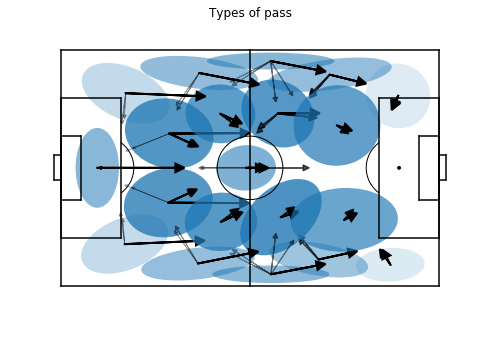

keeper_catch


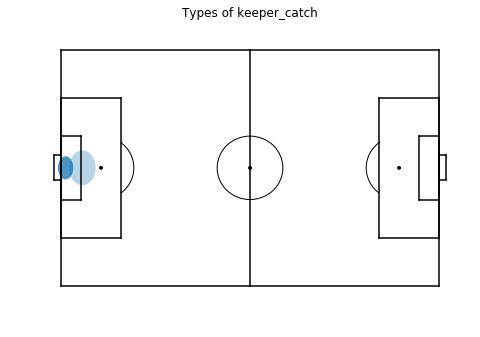

offside


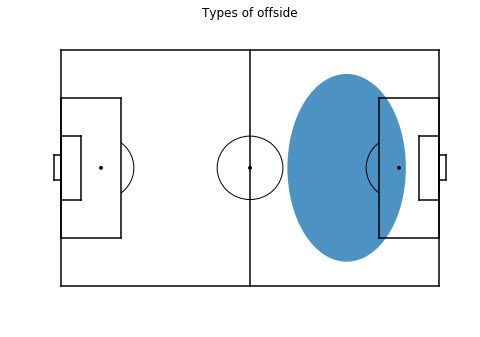

foul


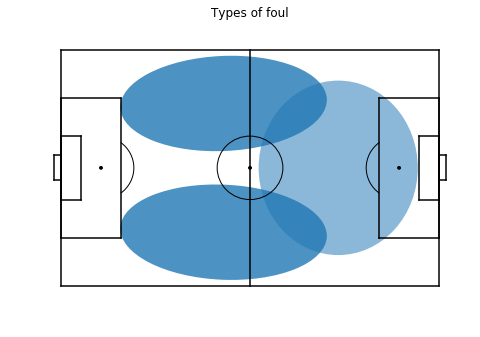

clearance


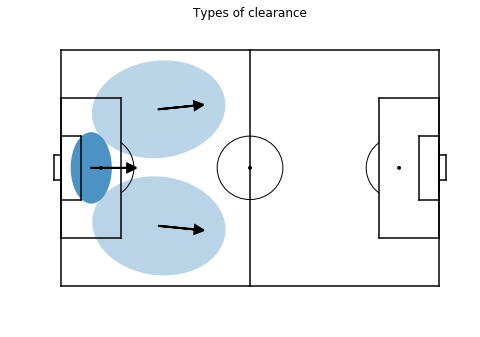

receival


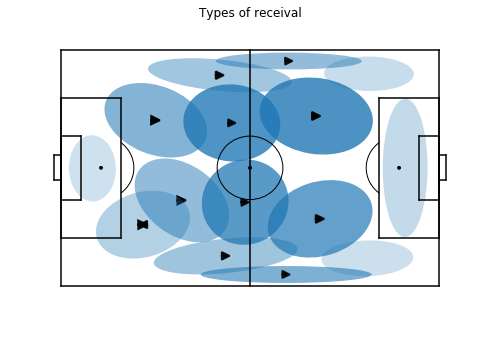

goal


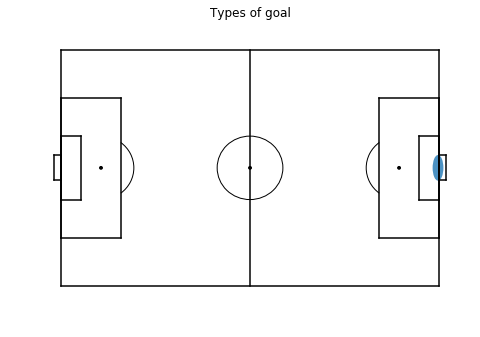

shot


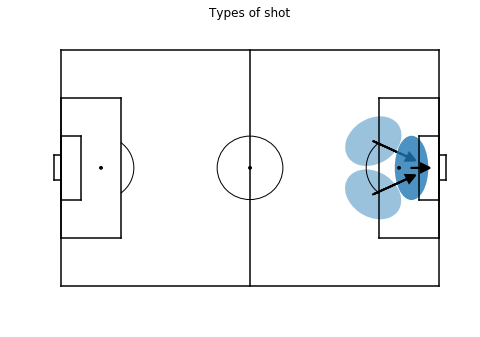

tackle


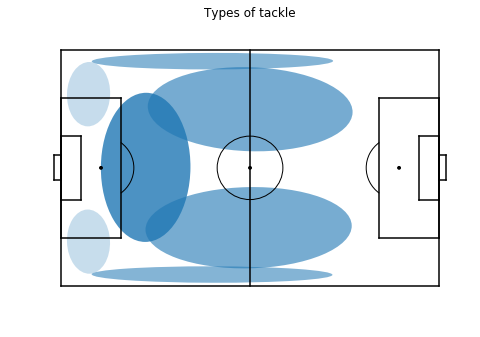

interception


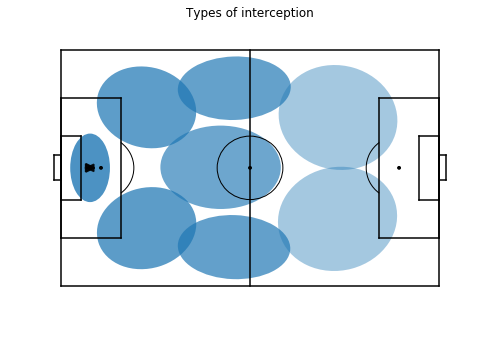

corner


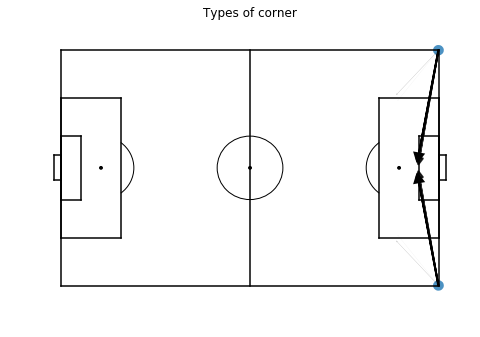

yellow_card


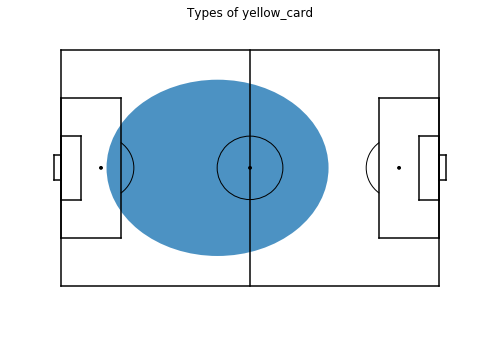

freekick


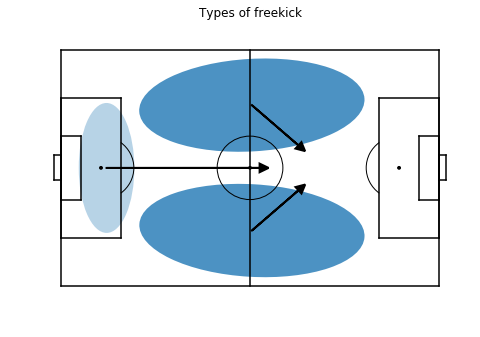

goalkick


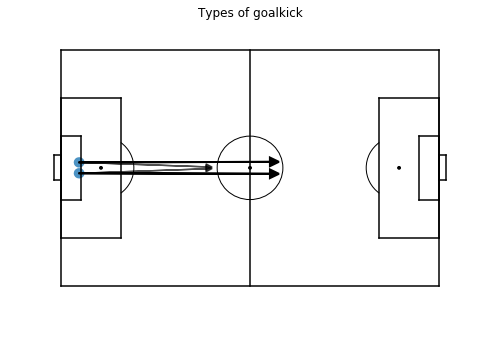

dribble


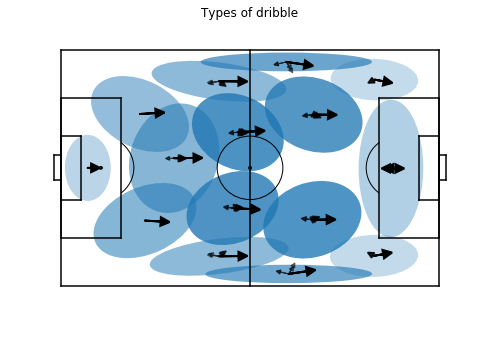

take_on


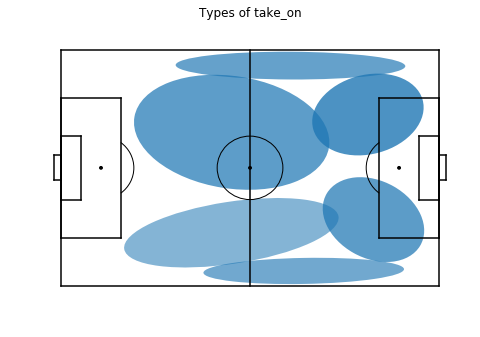

cross


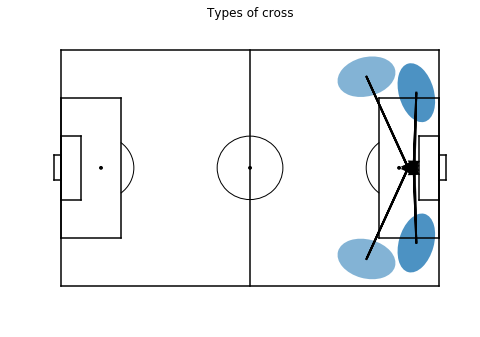

bad_touch


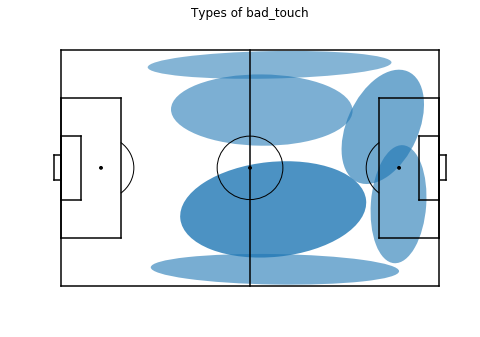

throw_in


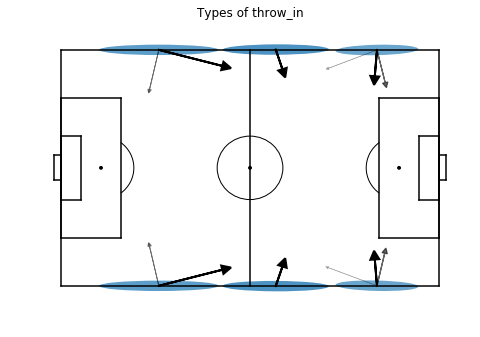

out


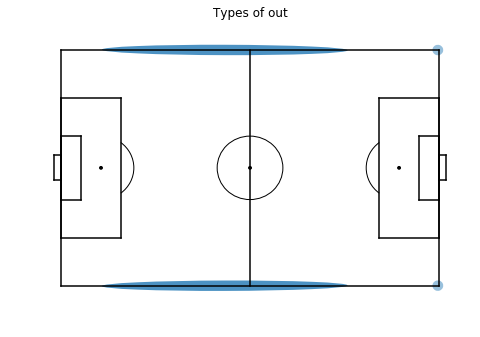

In [151]:
for m_i in models_i:
    ax = mps.field(show=False,figsize=8)
    print(m_i.name)
    strengths_i = m_i.weights_ / np.max(m_i.weights_) * 0.8
    for i,(mean,covar,strength_i) in enumerate(zip(m_i.means_, m_i.covariances_,strengths_i)):
        vis.add_ellips(ax,mean,covar,alpha=strength_i)
        #vis.add_ellips(ax,mean,[[covar[0],0],[0,covar[1]]],alpha=strength_i)
        x,y = mean
        for m_ii in models_ii:
            if f"{m_i.name}_{i}" == m_ii.name:
                strengths_ii = m_ii.weights_ / np.max(m_ii.weights_)
                for j in range(m_ii.n_components):
                    we = w_ii[f"{m_ii.name}_{j}"].values
                    #x = np.average(m_ii.df["x"].values,weights=we)
                    #y = np.average(m_ii.df["y"].values,weights=we)
                    dx = np.average(m_ii.df["dx"].values,weights=we)
                    dy = np.average(m_ii.df["dy"].values,weights=we)
                    strength_ii = strengths_ii[j]
                    d=1
                    vis.add_arrow(ax,x,y,d*dx,d*dy,
                                  alpha=strength_ii,
                                  linewidth=2*strength_ii,
                                  arrowsize=2.5*strength_ii,
                                  #linewidth=2,
                                  threshold=1)
    plt.title(f"Types of {m_i.name}")
    plt.show()

In [ ]:
import numpy as np
for prefix in w_i.columns[:10]:
    prefix_columns = list(c for c in w_ii.columns if prefix + "_" in c)
    print(prefix,len(prefix_columns))
    vis.plot_actions(a,w_ii[prefix_columns],samplefn="uni")

pass_16_1 6544


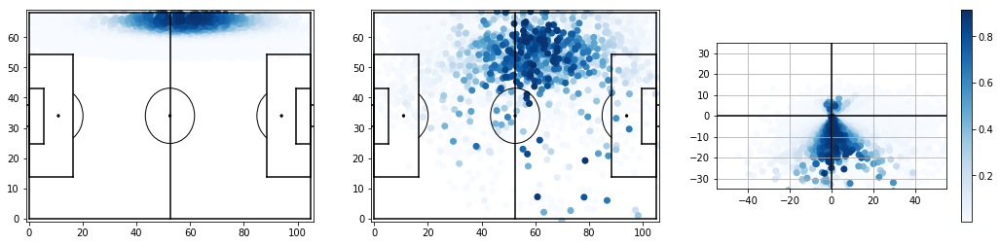

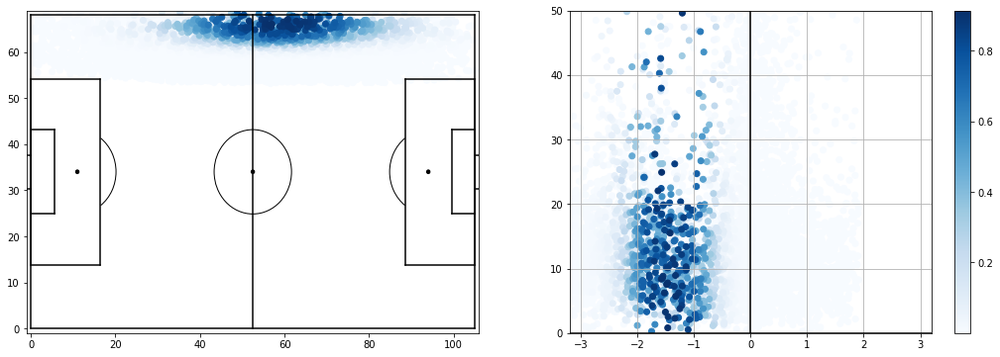

pass_16_2 3922


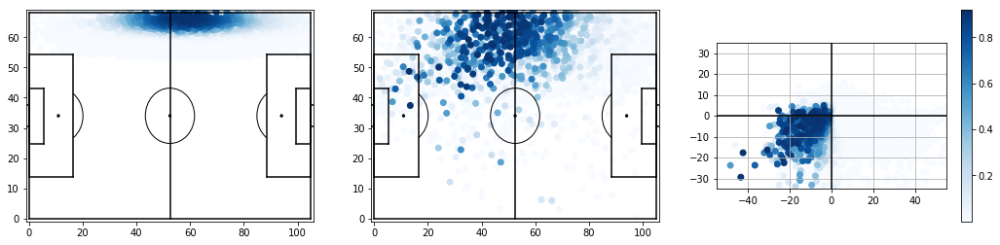

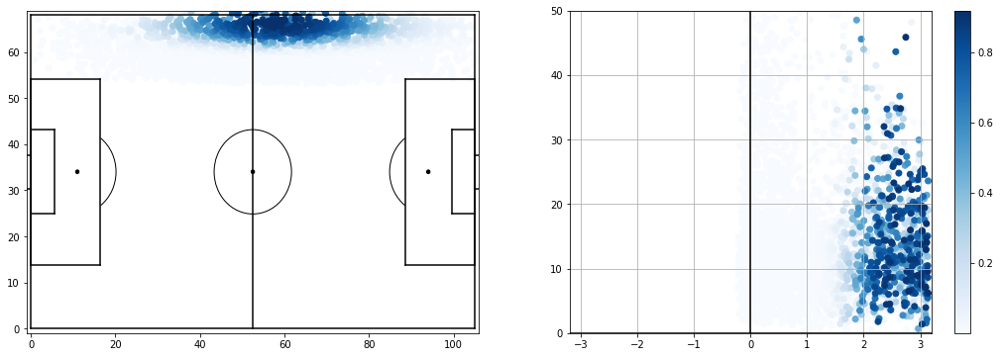

pass_16_3 3010


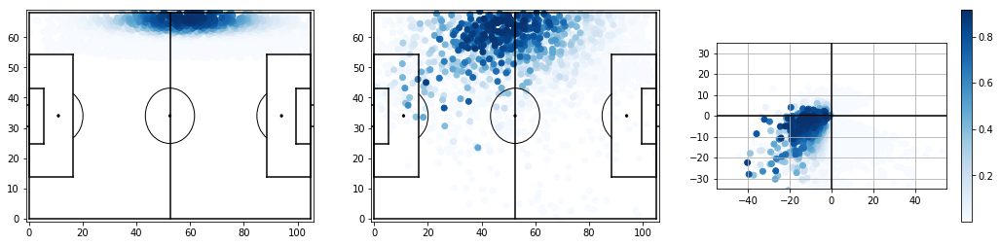

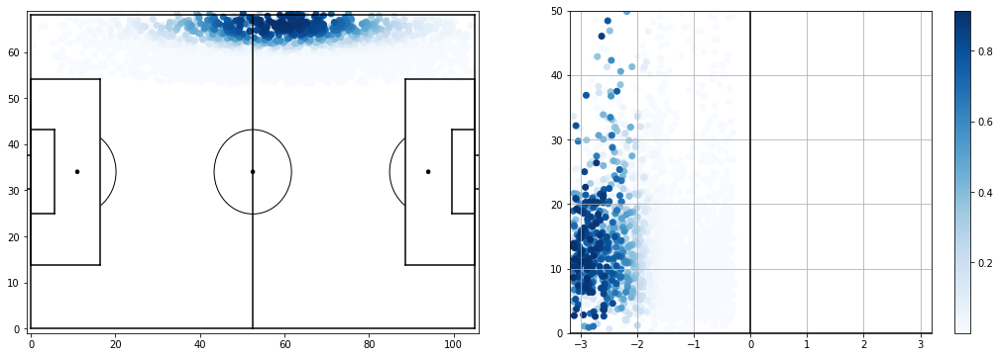

pass_16_4 6542


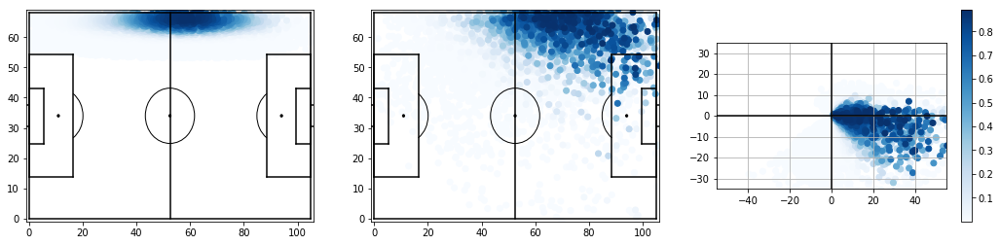

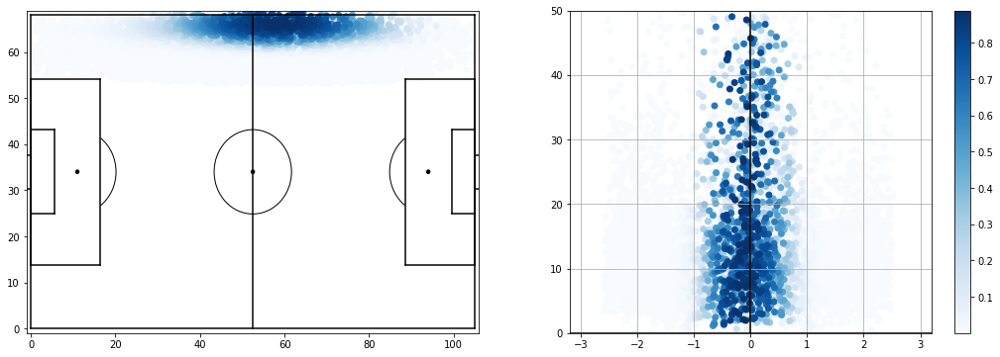

pass_17_0 12427


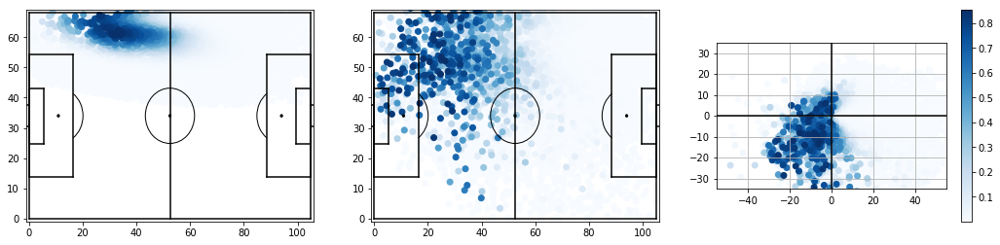

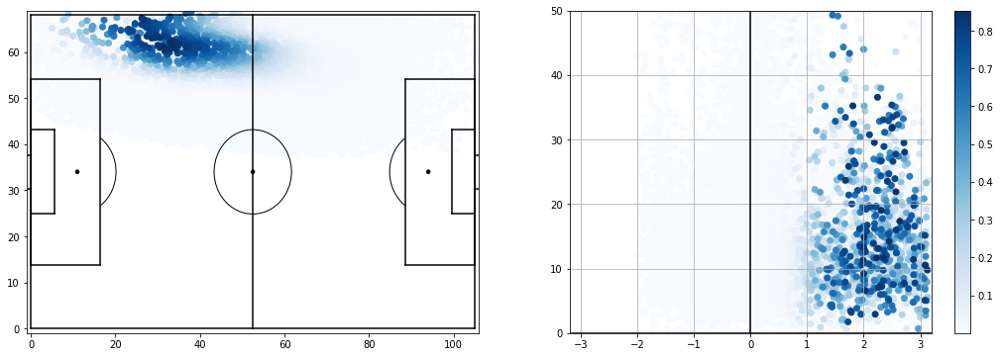

pass_17_1 12539


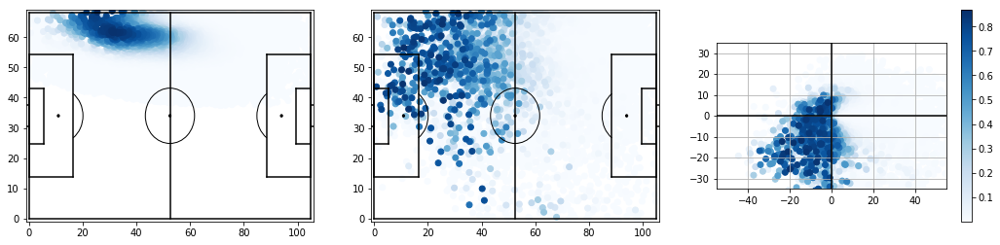

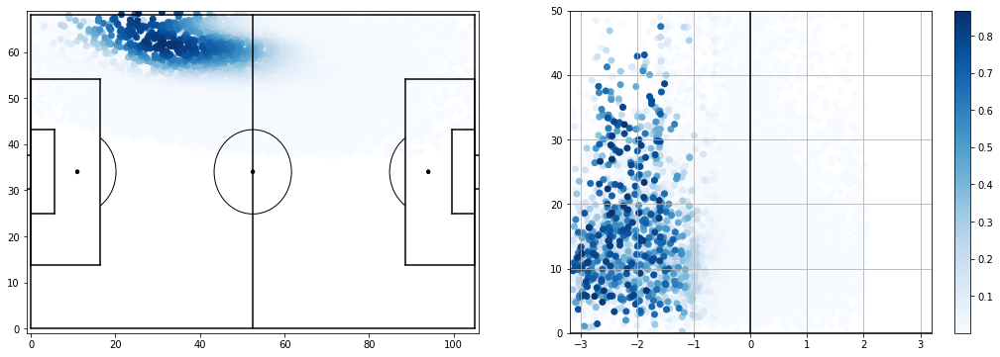

pass_17_2 16023


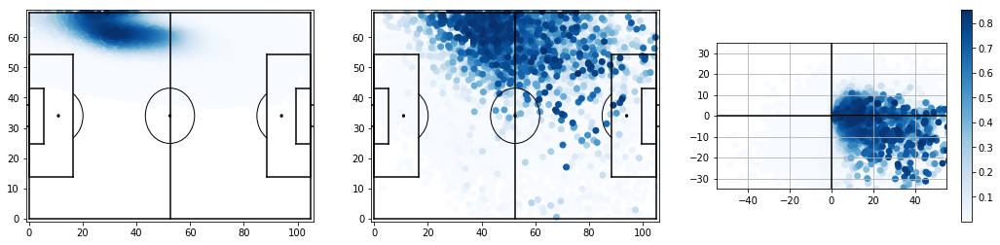

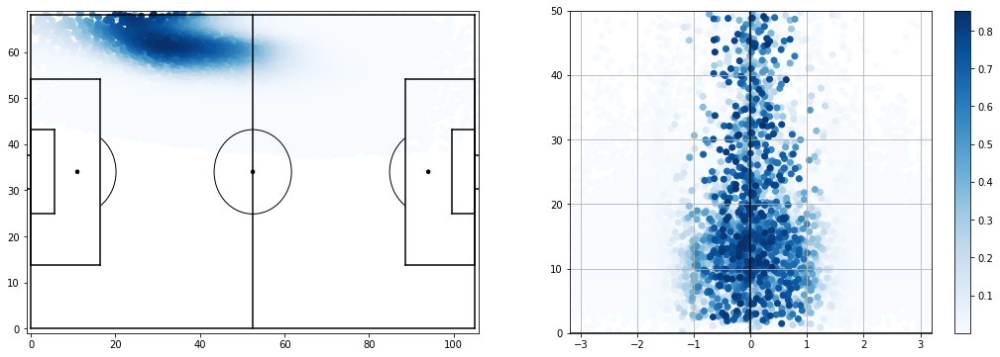

pass_18_0 12346


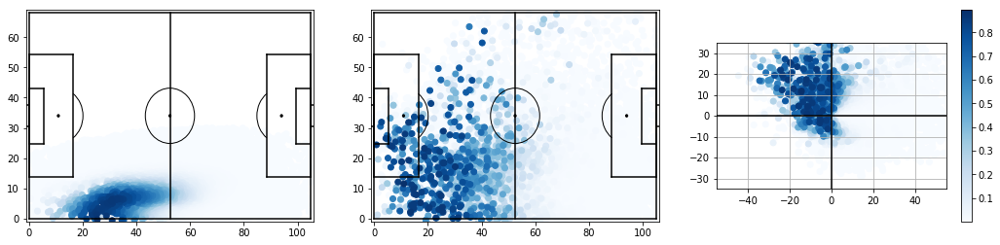

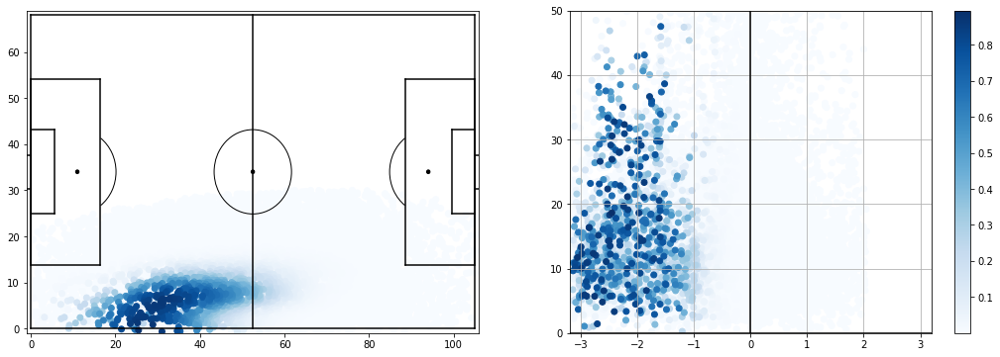

pass_18_1 12170


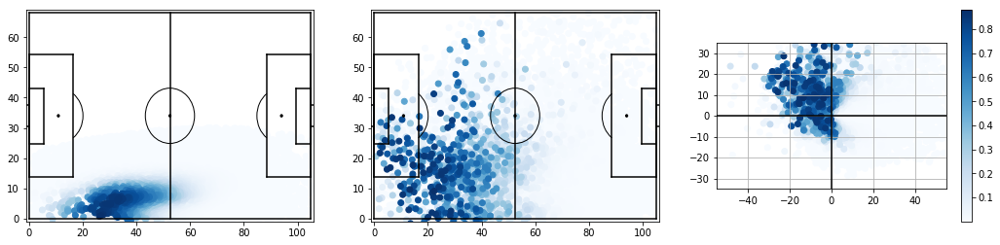

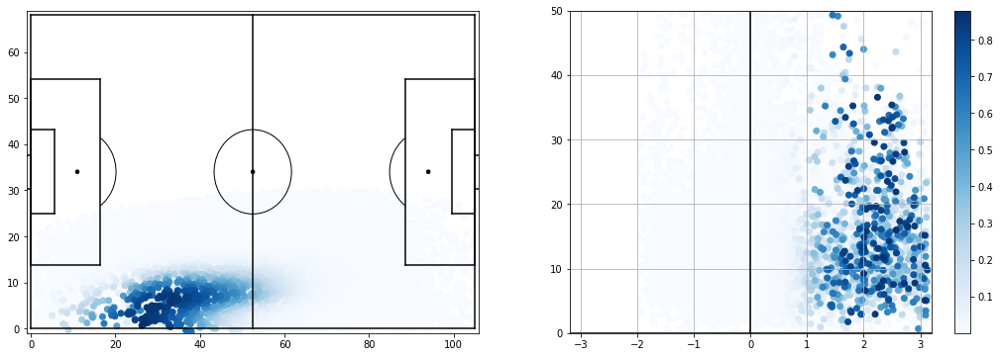

pass_18_2 15778


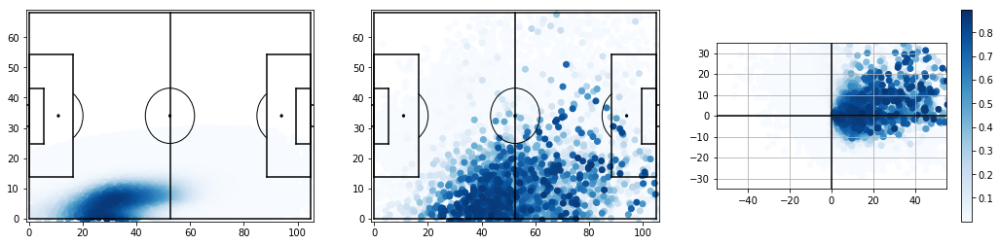

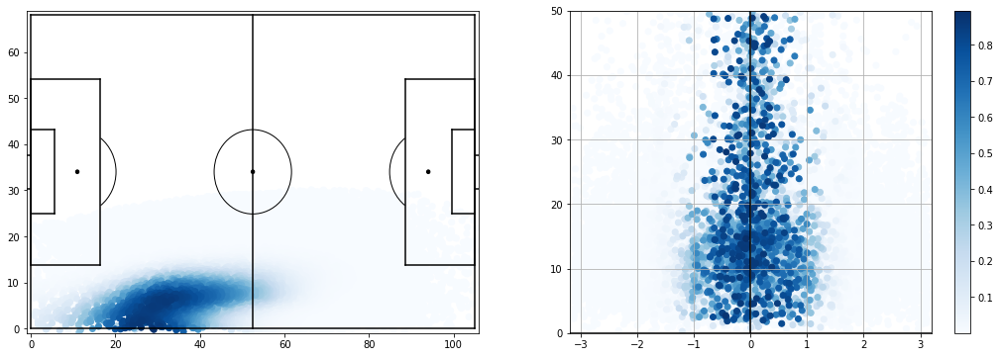

In [154]:
for column in w_ii.columns[50:60]:
    probs = w_ii[column]
    pos_prob_idx = probs > 1e-10
    print(column,sum(pos_prob_idx))
    dfc = a.reset_index()[pos_prob_idx].copy()
    dfc["membership"] = probs[pos_prob_idx]
    dfc = dfc.sort_values("membership",ascending=True)

    axs = vis.axes3()
    sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
    plt.colorbar(sc)
    axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    axs[2].scatter(dfc.dx,dfc.dy,c=dfc.membership,cmap="Blues")
    plt.show()

    axs = vis.axesxypolar()
    sc = axs[0].scatter(dfc.x,dfc.y,c=dfc.membership,cmap="Blues")
    plt.colorbar(sc)
    #axs[1].scatter(dfc.x + dfc.dx,dfc.y + dfc.dy,c=dfc.membership,cmap="Blues")
    axs[1].scatter(dfc.mov_angle_a0,dfc.mov_d_a0,c=dfc.membership,cmap="Blues")
    #axs[1].hist(dfc.mov_angle_a0)
    
    plt.show()

In [ ]:
ucprobas = pat.uncouple_probabilities(probas,a.is_home.values)
ucprobas
ucprobas.values.sum()

In [ ]:
prev = ucprobas.values[:-1]
nex = ucprobas.values[1:]
print(prev.shape)
trans = np.dot(prev.T,nex)
plt.matshow(trans)
plt.colorbar()
plt.show()
trans /= trans.sum()
# for i in range(len(trans[0])):
#     trans[i,:] /= trans[i,:].sum()
trans.sum()
ori_trans = trans

In [ ]:
forwardtrans = trans.copy()
for i in range(len(forwardtrans[0])):
     forwardtrans[i,:] /= forwardtrans[i,:].sum()
forwardtrans.sum()

backwardtrans = trans.T.copy()
for i in range(len(backwardtrans[0])):
     backwardtrans[i,:] /= backwardtrans[i,:].sum()
backwardtrans.sum()

In [ ]:
def get_name(i):
    ty,k = gmme._global_to_local(i % gmme.total_components())
    is_opp = i > gmme.total_components() - 1
    return "_".join([ty,str(k),str(is_opp)])

In [ ]:
from sklearn.cluster import SpectralClustering

nc = 10

clustering = SpectralClustering(affinity="precomputed",n_clusters=nc).fit((sim + sim.T)/2)

for label in range(nc):
    print(label)
    ax = mps.field(show=False)
    prototypes = []
    for i in np.where(clustering.labels_ == label)[0]:
        ty,k = gmme._global_to_local(i % gmme.total_components())
        is_opp = i > gmme.total_components() - 1
        prototypes.append((ty,is_opp))
        if is_opp:
            color = "red"
        else:
            color = "blue"
        vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color=color,mirror=is_opp,show=False)
    print(Counter(prototypes))
    plt.show()

In [ ]:
sim = (np.dot(forwardtrans,backwardtrans) + np.dot(backwardtrans,forwardtrans))/2

from sklearn.cluster import KMeans

nc = 30

clus = KMeans(nc).fit(sim)

for label in range(nc):
    print(label)
    ax = mps.field(show=False)
    prototypes = []
    for i in np.where(clus.labels_ == label)[0]:
        ty,k = gmme._global_to_local(i % gmme.total_components())
        is_opp = i > gmme.total_components() - 1
        prototypes.append((ty,is_opp))
        if is_opp:
            color = "red"
        else:
            color = "blue"
        vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color=color,mirror=is_opp,show=False)
    print(Counter(prototypes))
    plt.show()

In [ ]:
from collections import Counter

sim = (np.dot(forwardtrans,backwardtrans) + np.dot(backwardtrans,forwardtrans))/2

plt.matshow(sim)
plt.colorbar()
plt.show()

from sklearn.cluster import AgglomerativeClustering
nc = 50
clustering = AgglomerativeClustering(affinity="euclidean",linkage="average",n_clusters=nc).fit(sim.T)

for label in range(nc):
    print(label)
    ax = mps.field(show=False)
    prototypes = []
    for i in np.where(clustering.labels_ == label)[0]:
        ty,k = gmme._global_to_local(i % gmme.total_components())
        is_opp = i > gmme.total_components() - 1
        prototypes.append((ty,is_opp))
        if is_opp:
            color = "red"
        else:
            color = "blue"
        vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color=color,mirror=is_opp,show=False)
    print(Counter(prototypes))
    plt.show()

In [ ]:
i = 170
ty,k = gmme._global_to_local(i % gmme.total_components())
is_opp = i > gmme.total_components() - 1
print(ty,k,is_opp)
vis.plot_component_w_arrow(gmme.models[ty],k,color="red",mirror=is_opp)

oldty,oldk,oldopp = ty,k,is_opp

v = np.zeros(gmme.total_components()*2)
v[i] = 1

forv = np.dot(np.dot(v,forwardtrans),backwardtrans)
plt.plot(forv)
plt.show()

backv = np.dot(np.dot(v,backwardtrans),forwardtrans)
plt.plot(backv)
plt.show()

newv = (forv + backv)/2
plt.plot(newv)
plt.show()

for j in np.argsort(newv)[::-1][:4]:
    ty,k = gmme._global_to_local(j % gmme.total_components())
    is_opp = j > gmme.total_components() - 1
    print(ty,k,is_opp)
    ax = vis.plot_component_w_arrow(gmme.models[oldty],oldk,color="red",mirror=oldopp,show=False)
    vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color="blue",mirror=is_opp)

In [ ]:
trans1 = ori_trans.copy()
for _i in range(10):
    print(trans1.sum())
    trans1 = np.dot(ori_trans.T,trans1)
    trans1 /= trans1.sum()

In [ ]:
delta_trans = trans1 - ori_trans
plt.matshow(delta_trans)
plt.colorbar()
plt.show
delta_trans.max(), delta_trans.min()

In [ ]:
trans = delta_trans
trans = trans1

In [ ]:
trans.sum()

In [ ]:
plt.hist([p for p,i,j in probs])
plt.show()

In [ ]:
probs = []
for i in range(len(trans)):
    for j in range(len(trans)):
        probs.append((trans[i,j],i,j))
probs = sorted(probs,reverse=True)
movs = [(p,i,j) for p,i,j in probs]# if i != j]

cols = list(ucprobas.columns)

def test(i,j):
    return True
    return "goal1" in cols[j]# and "opp" not in cols[j]
    return "shot" in cols[i] and "opp" not in cols[j]

interestmovs = [(p,i,j) for p,i,j in movs 
                if test(i,j)
                #"pass" not in cols[i]
                   # and "receival" not in cols[i]
                   # and "dribble" not in cols[i]
               ]

for p,i,j in interestmovs[:10]:
    print(p,i,j)
    print(cols[i],"(red)","->",cols[j],"(blue)")
    ax = mps.field(show=False)
    ty,k = gmme._global_to_local(i % gmme.total_components())
    is_opp = i > gmme.total_components() - 1
    vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color="red",mirror=is_opp,show=False)
    ty,k = gmme._global_to_local(j % gmme.total_components())
    is_opp = j > gmme.total_components() - 1
    vis.plot_component_w_arrow(gmme.models[ty],k,ax=ax,color="blue",mirror=is_opp,show=False)
    plt.show()

In [ ]:
labels = np.argmax(probas.values,axis=1)

for p,i,j in movs[:10000]:
    cols = gmme._columns()
    if "shot" in cols[j] and "kick" not in cols[j]:# or True:
        print(p,i,j)
        print(cols[i],"(blue)","->",cols[j],"(red)")
        l_idx = (labels == i) | (labels == j)
        twocolors = ["blue" if l == i else "red" for l in labels[l_idx]]
        axs = vis.locmovaxes()
        axs[0].scatter(a.x[l_idx],a.y[l_idx],color=twocolors)
        axs[1].scatter(a.dx[l_idx],a.dy[l_idx],color=twocolors)
        plt.show()
    if p < 50:
        break

In [ ]:
labels = np.argmax(probas.values,axis=1)

for p,i,j in movs[:10000]:
    cols = gmme._columns()
    if "shot" in cols[j] and "kick" not in cols[j]:# or True:
        print(p,i,j)
        print(cols[i],"(blue)","->",cols[j],"(red)")
        l_idx = (labels == i) | (labels == j)
        twocolors = ["blue" if l == i else "red" for l in labels[l_idx]]
        axs = vis.locmovaxes()
        axs[0].scatter(a.x[l_idx],a.y[l_idx],color=twocolors)
        axs[1].scatter(a.dx[l_idx],a.dy[l_idx],color=twocolors)
        plt.show()
    if p < 5:
        break